![KU Leuven](img/logo.png)
# Biometrics System Concepts
## Assignment 2: Fingerprint and Iris based Identification

**Name:** Roberto Hernández Ruiz |
**Student Nr:** 0873235 |
**Date:** April 29, 2022
---

Implement and test a keypoint-based fingerprint and iris recognition system and fuse the two systems together.

A high-level description is provided with links to or hints of code snippets and libraries that you can reuse/adapt at your will (with proper referencing!).

This document is structured as below:  
* [I. Setting](#I.-Setting)
* [II. Fingerprint Recognition](#II.-Fingerprint-Recognition)
  1. Reading data
  2. Baseline model
    1. Choosing a similarity metric
    2. Constructing the similarity matrix
    3. Validation
  3. Model extension 1: local similarity¶
    1. Image enhancements
    2. Feature extraction
    3. local Keypoint Matching
    4. Local Similarity metric
    5. Construct local similarity matrix
    6. Validation
  4. Model extension 2: Global similarity
    1. Image alignment
    2. Global Similarity Metric
    3. Construct global similarity matrix
    4. Validation
  5. Model extension 3: Hybrid features
    1. Hybrid Similarity metric
    2. Construct hybrid similarity matrix
    3. Validation
  6. Solve the murder case
* [III. Iris Recognition](#III.-Iris-recognition)
  1. Reading data
  2. Biometric iris recogntion System
    1. Image enhancement
    2. Construct similarity matrix
    3. Validation
  3. Solve the murder case
* [IV. Multimodal System](#IV-Multimodal-System)
  1. Score fusion
    1. Construct similarity matrix
    2. Validation
  2. Solve the murder case  
* [V. Assignment Instructions](#V.-Assignment-Instructions)


Code examples will be provided below. You can and are invited to adapt these at your will (different parameter settings, different choices of alogorithmic components, add external python files, ...). Try to keep things structured!


In [1]:
#to plot figures inline
%matplotlib inline

# OpenCV package
import cv2
# Standard array processing package
import numpy as np
# Plotting library
from matplotlib import pyplot as plt
# Setting the default colormap for pyplot
import matplotlib as mpl
mpl.rc('image', cmap='gray')
# File path processing package
from pathlib import Path
# Local modules for fingerprint enhancement
import src.fprmodules.enhancement as fe
# Package for some simple biometric metrics. 
# Of course you can use the code you have developed in the previous assignment
from sklearn.metrics import roc_curve
# Pickle allows to save and read intermediate results (similar to save and load in Matlab)
import pickle
# A visual progress bar library
from tqdm.notebook import tqdm as tqdm_notebook
# Allows us to generate markdown using python code
from IPython.display import Markdown
# Data analysis and manipulation tool
import pandas as pd
# Cartesian product of 2 iterables
from itertools import product
# Path name pattern searching
import glob
# OS interfaces
import os
# Compression interface
import zlib
# Binary encoding
from base64 import urlsafe_b64encode as b64e, urlsafe_b64decode as b64d

# Your imports here (if any)
import ipywidgets


In [2]:
# Helper functions
def plot_image_sequence(data, n, imgs_per_row=7, figsize=(10,10), cmap='gray'):
    n_rows = 1 + int(n/(imgs_per_row+1))
    n_cols = min(imgs_per_row, n)

    f,ax = plt.subplots(n_rows,n_cols, figsize=(figsize[0]*n_cols,figsize[1]*n_rows))
    for i in range(n):
        if n == 1:
            ax.imshow(data[i], cmap=cmap)
        elif n_rows > 1:
            ax[int(i/imgs_per_row),int(i%imgs_per_row)].imshow(data[i], cmap=cmap)
        else:
            ax[int(i%n)].imshow(data[i], cmap=cmap)
    plt.show()

## <a id='I.-Setting'></a>I. Setting

Oh no! A woman is found dead in her hotel room. Multiple stab wounds in the chest indicate that it was... *MURDER!*

The police has locked down the hotel and you were brought in to assist the forensics team in finding the murderer. Your associates have reviewed the security footage and have detected a person entering the room with the victim just 15 minutes before the estimated time of death. Unfortunately, the perpetrator did their homework and they were very careful not to give away any leads that might help you identify them. They slipped however, and on their way out touched the door knob with their bare hand...

## <a id='II.-Fingerprint-Recognition'></a> II. Fingerprint Recognition

### 1. Reading data
#### *Reading the image data and converting to grayscale*


Before you get started on anything it is always a good idea to visualise your data. Let's first have a look at the fingerprint that was collected from the door knob first... 

Note that we convert the data to grayscale, we're not interested in color values (and don't have them).

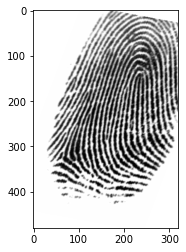

In [3]:
perpetrator_fp = cv2.imread('./perpetrator_fp.png')

assert (
    (perpetrator_fp[...,0] == perpetrator_fp[...,1]).all() and
    (perpetrator_fp[...,1] == perpetrator_fp[...,2]).all()
)

perpetrator_fp = cv2.cvtColor(perpetrator_fp, cv2.COLOR_BGR2GRAY)

plt.imshow(perpetrator_fp);

Now, let's have a look at the other fingerprint data that was provided to you. This data is stores in `data/NIST301/`. There were apparently 100 guests in the hotel at the time of murder. The filename indicates the subject identifier. Below we have provided a function to read and label these fingerprints. Let's take a look!

In [4]:
def read_DB(path):
    images = []
    labels = []
    
    imagePaths = sorted(Path(path).rglob("*.png"))
    for imagePath in tqdm_notebook(imagePaths):
        image = cv2.imread(path + imagePath.name)
        if (len(image.shape) > 2): #(480, 320, 3)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        images.append(image)
        label = imagePath.stem[0:3] # extract the person number or identifier
        labels.append(label)
    return (images, labels)


# Read the fingerprint database
images_db, labels_db = read_DB('data//NIST301//')

# Save some metadata
n_imgs = len(images_db)
img_height, img_width = images_db[0].shape #all of them have the same shape

Markdown(f"""Here are some samples from the database, which contains {n_imgs} images of size {img_height}x{img_width}. Remember, visualization is always a good idea, so let's visualize some""")

  0%|          | 0/100 [00:00<?, ?it/s]

Here are some samples from the database, which contains 100 images of size 480x320. Remember, visualization is always a good idea, so let's visualize some

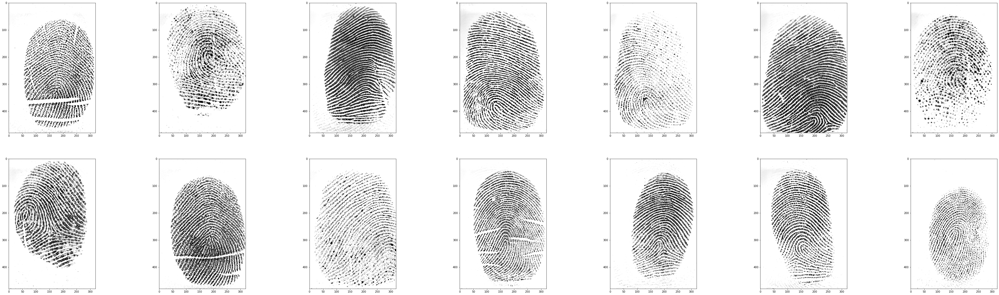

In [5]:
n = 14
plot_image_sequence(images_db,n) 

### 2. A baseline model

#### 2.1. Choosing a similarity metric
In your first assignment the similarity metric was already provided, in this assignment you have the chance to play around with distances and similarities yourself! Let's give it a shot!

Consider the similarity function below:

In [6]:
mss = lambda x,y: 1/(1+np.square(x-y).mean())

#### 2.2. Constructing the similarity score table
Since we're not in an authentication scenario, all we can do is to calculate the similarity scores between each fingerprint in the database and the one from the perpetrator.
Once we have a metric for each image, we can just sort them and store them in a table. Note that you have space to get creative with visualization!

In [7]:
def constructSimilarityTable(org_img,img_db, labels, dist_func):
    #dist_func is the function that computes the distance between two images
    data=[]
    for i,img in enumerate(img_db):
        data.append([
            labels[i],
            dist_func(org_img, img)]) #add to list data the personID and the distance from him to the perpetrator
    assert (len(data) == len(img_db)) #ensure we have all distances in the dataset btw example and perpetrator
    return pd.DataFrame(data, columns=['id', 'score'])

sim_tb0 = constructSimilarityTable(perpetrator_fp,images_db, labels_db, mss)
sim_tb0 #take a look at the table

,id,score
0,001,0.015581
1,002,0.015476
2,003,0.014335
3,004,0.013319
4,005,0.015193
...,...,...
95,096,0.015435
96,097,0.015017
97,098,0.014682
98,099,0.012899


We can see that the highest match score 0.0170 
belongs to subject 088. However, subject 081 is not far behind with 
a score of 0.0168! Surely we can do a better job than that. Or can we..?

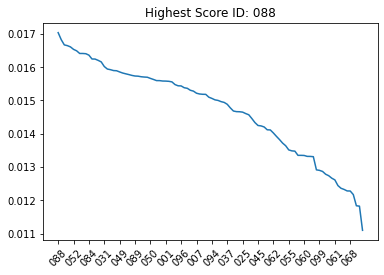

In [8]:
ids,scores = sim_tb0.sort_values(by='score', ascending=False).values[:,0],sim_tb0.sort_values(by='score', ascending=False).values[:,1]
plt.plot(ids,scores);
plt.xticks(np.arange(0,100,5),ids[np.arange(0,100,5)],rotation = 45);
plt.title('Highest Score ID: '+ids[0]);

Markdown(f'''We can see that the highest match score {scores[0]:.4f} 
belongs to subject '''+ids[0]+'. However, subject '+ids[1]+f''' is not far behind with 
a score of {scores[1]:.4f}! Surely we can do a better job than that. Or can we..?''')

<div class="alert alert-block alert-success">
<b>Q1: </b> Now that we have some results, is the given similarity function a good metric to quantify the distance between two fingerprints? Is it reliable enough to incriminate a suspect? What are its limitations?
</div>

### 3. Model extension 1 
#### *Local Similarity*

#### 3.1. Image enhancements
In this next step we re-use code developed by [Utkarsh Deshmukh](https://github.com/Utkarsh-Deshmukh/Fingerprint-Enhancement-Python), to enhance the fingerprint images. It is a Python-recode of Matlab-code developed by [Peter Kovesi](https://www.peterkovesi.com/matlabfns/index.html#fingerprints). I have slightly adapted this code to make it more compliant with OpenCV. It uses gradient-based orientation and local frequency estimation as input to an orientation and frequency selective filtering using a Gabor filterbank. At the same time a foreground region segmentation (mask) is determined by calculating the standard deviation in local windows and thresholding above a certain level. Please briefly read through the [github README](https://github.com/Utkarsh-Deshmukh/Fingerprint-Enhancement-Python) to better understand what it is doing! 

In [9]:
try:
    with open("db_pkl/images_masks_db.pkl","rb") as f:
        images_enhanced_db, masks_db = pickle.load(f)
except:
    images_enhanced_db, masks_db = enhance_images(images_db)
    with open("db_pkl/images_masks_db.pkl",'wb') as f:
        pickle.dump([images_enhanced_db,masks_db],f)

In [10]:
# Calculate the enhanced images and the associated segmentation masks

def enhance_images(images):
    images_e_u = []
    masks = []
    for i, image in enumerate(tqdm_notebook(images)):
        try:
            # Gabor filtering
            img_e, mask, orientim, freqim = fe.image_enhance(image)
            # Normalize in the [0,255] range
            img_e_u = cv2.normalize(img_e, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=0)
            images_e_u.append(img_e_u)
        except:
            print('error for: ', i)
            images_e_u.append(image)
        masks.append(mask)
    return np.array(images_e_u), np.array(masks)

#images_enhanced_db, masks_db = enhance_images(images_db)

Array of enhanced images: 100 examples of size ( 480 , 320 ).


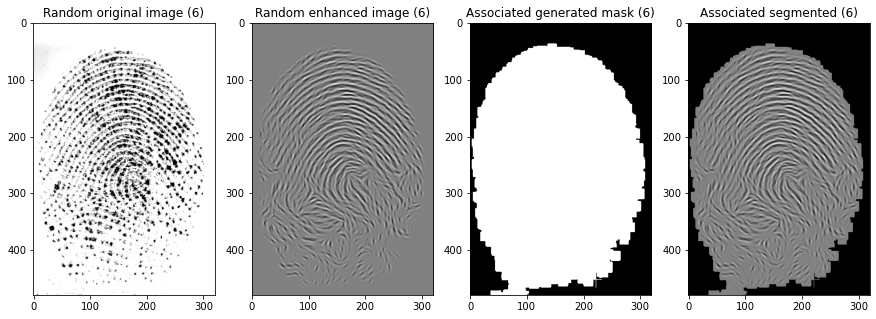

In [54]:
# Explore and look at outputs
print("Array of enhanced images:",images_enhanced_db.shape[0],"examples of size (",images_enhanced_db.shape[1],",",images_enhanced_db.shape[2],").")
#masks_db is exactly the same shape
n = np.random.randint(0,100)

fig = plt.figure(figsize=(15, 5))
fig.add_subplot(1, 4, 1)
plt.imshow(images_db[n]); 
plt.title(f"Random original image (%d)" % n);
fig.add_subplot(1, 4, 2)
plt.imshow(images_enhanced_db[n]); 
plt.title(f"Random enhanced image (%d)" % n);
fig.add_subplot(1, 4, 3)
plt.imshow(masks_db[n]); 
plt.title(f"Associated generated mask (%d)" % n);
fig.add_subplot(1, 4, 4)
plt.imshow(masks_db[n]*images_enhanced_db[n]); 
plt.title(f"Associated segmented (%d)" % n);


<div class="alert alert-block alert-info">
<b>Tip:</b> Intermediate (computation heavy) results can be saved on file using the pickle package, use <code>pickle.dump</code> to save and <code>pickle.load</code> to load data from a file. The code snippet below will run the computation and save results if there are no previous records, and reload them in later runs. 
Have a look at the <a href="https://wiki.python.org/moin/UsingPickle">wiki</a> for more information. 
<pre>
<code>
<!-- language: lang-python -->
try:
    with open("images_masks_db.pkl","rb") as f:
        images_enhanced_db, masks_db = pickle.load(f)
except:
    images_enhanced_db, masks_db = enhance_images(images_db)
    with open("images_masks_db.pkl",'wb') as f:
        pickle.dump([images_enhanced_db,masks_db],f)
</code>
</pre>

</div>


Note that the images are now much more crisp and that the foreground segmentation was successful even if the technique is rather simple!

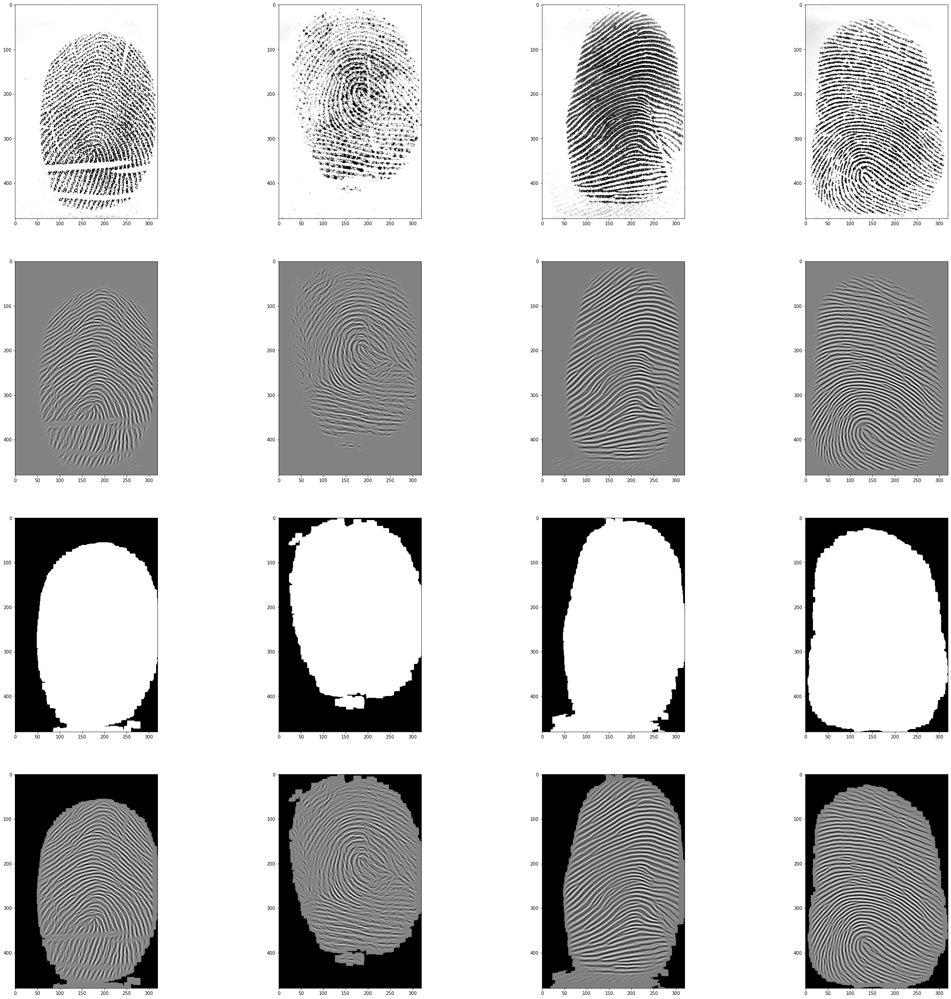

In [12]:
n=4
images_segmented_db = [a*b for a,b in zip(images_enhanced_db,masks_db)] #enhanced img * mask
plot_image_sequence(images_db[:n] + images_enhanced_db.tolist()[:n] + masks_db.tolist()[:n] + images_segmented_db[:n], 4*n, n)

#### 3.2. Feature extraction
As you might have noticed by now comparing images on a pixel level is too simple and limited. The basic/traditional fingerprint matching algorithm are based on matching keypoints, called minutiae. They are defined as the ridge endings and bifurcations and can be determined by first thresholding the FP image and skeletonizing/thinning the enhanced image. For those really interested (but not part of this assignment) in experimenting with such an approach, some code is provided in the `fprmodules/minutiae_extraction` folder.

Instead, we will rely on establised methods developed in Computer Vision, where the use of keypoint features has proven to be very succesfull (prior to the advent of Deep Learning) in image classification, image alignment and object recognition tasks. A keypoint is a point of interest in an image, it does not necesarily need to be recognisable by a human but it can be. In this project we use keypoints to compare images on 3 levels:
1. Local feature descriptors
2. Global features
3. Hybrid features

To better highlight what is going on we will plot the results on two fingerprint images from our database.

In [13]:
# test example
testNr1 = 48
testNr2 = 17

**Keypoint detection** algorithms will result in points of interest on your image, which keypoints are used is dependent on the technique. We will make use of ORB (Oriented FAST and Rotated BRIEF) detection and descriptor algorithm as implemented in [OpenCV ORB](https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_feature2d/py_orb/py_orb.html).


You are encouraged to try out a series of detection/description/matching algorithms. A short overview of these methods can be found in the OpenCV documentation: [Feature detection and description](https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_feature2d/py_table_of_contents_feature2d/py_table_of_contents_feature2d.html). 
Please read these pages carefully and try to understand these methods.

In [14]:
def detect_keypoints(img, mask, keypoint_detector, kernel_size=(5,5)):
    """
        Detects keypoints in an image. 
        
        Note: Many false keypoints will be generated at the edge of the foreground mask, since ridges seem to terminate due to the clipping.
        we remove these by a morpholigical erosion (shrinking) of the foreground mask and deleting the keypoints outside.
    """
    # find the keypoints with ORB

    kp = keypoint_detector.detect(img)
    #convert mask to an unsigned byte
    mask_b = mask.astype(np.uint8)  
    # morphological erosion
    mask_e = cv2.erode(mask_b*255, kernel = np.ones(kernel_size,np.uint8), iterations = 5)
    # remove keypoints and their descriptors that lie outside this eroded mask
    kpn = [kp[i] for i in range(len(kp)) if mask_e.item(int(kp[i].pt[1]),int(kp[i].pt[0])) == 255] 
    return kpn


Number of keypoints with ORB: 431 kp1 points and 445 kp2 points.


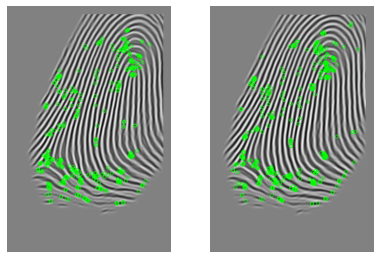

In [15]:
# We are going to use ORB detection and descriptor algorithm
detector1 = cv2.ORB_create()
kp1_orb = detect_keypoints(images_enhanced_db[testNr1], masks_db[testNr1], detector1)
kp2_orb = detect_keypoints(images_enhanced_db[testNr2], masks_db[testNr2], detector1)
print("Number of keypoints with ORB:",len(kp1_orb),"kp1 points and",len(kp2_orb),"kp2 points.") #list of n keypoints for each example

img1_orb = cv2.drawKeypoints(images_enhanced_db[testNr1],kp1_orb,None,color=(0,255,0), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)
img2_orb = cv2.drawKeypoints(images_enhanced_db[testNr2],kp2_orb,None,color=(0,255,0), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)

f, axarr = plt.subplots(1,2,sharey=True)
f.tight_layout()

#f.set_size_inches(10,8) #Uncomment below line to change figure size
axarr[0].axis('off')
axarr[1].axis('off')
axarr[0].imshow(img1_orb),axarr[1].imshow(img2_orb),plt.show();

**The Local Feature descriptor** will give you a vector describing the local region around the key-point in the feature space. Note that these feature descriptors give a vectorial summary of the neighbourhood around each keypoint. A simple metric on these vectors (Euclidean Distance for continuous variables, Hamming Distance for binary variables) can then be used to determine similarity.

In [16]:
def compute_local_descriptor(img, kp, detector):
    kp, descriptors = detector.compute(img, kp)
    return np.array(kp), descriptors

# For each keypoint, we have a vector that describes the local region around it
kp1_orb, local_des1_orb = compute_local_descriptor(images_enhanced_db[testNr1], kp1_orb, detector1)
kp2_orb, local_des2_orb = compute_local_descriptor(images_enhanced_db[testNr2], kp2_orb, detector1)
print("Feature extractor: (kp for example, vectors of local feature descriptors for each kp)")
print("ORB:",local_des1_orb.shape,local_des2_orb.shape)


Feature extractor: (kp for example, vectors of local feature descriptors for each kp)
ORB: (431, 32) (445, 32)


#### 3.3. Local Keypoint Matching
**Keypoint Matchers** match keypoints that have similar descriptors in an image pair and computes the distances between the best matching pairs of keypoints. In this implementation we make use of the brute force matcher of OpenCV, documentation can be found [here](https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_feature2d/py_matcher/py_matcher.html). As a distance between descriptors we make use of the normalised [Hamming distance](https://en.wikipedia.org/wiki/Hamming_distance). 

In [17]:
def brute_force_matcher(des1, des2, dist):
    """
      Brute Force matcher on a pair of KeyPoint sets using the local descriptor for similarity
      
      returns all pairs of best matches
    """
    
    # crossCheck=True only retains pairs of keypoints that are each other best matching pair
    bf = cv2.BFMatcher(dist, crossCheck=True)
    matches = bf.match(des1, des2)
    
    # sort matches based on descriptor distance
    matches.sort(key=lambda x: x.distance, reverse=False)
    
    return np.array(matches)

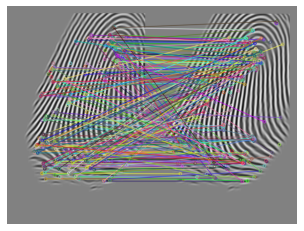

In [18]:
# ORB: Visualize the matched keypoints

# store the local keypoint matches
local_k1_k2_matches_orb = brute_force_matcher(local_des1_orb, local_des2_orb, cv2.NORM_HAMMING)

# save the source index and target index of the keypoints in the corresponding keypoint sets
local_pt_source, local_pt_target = np.array([
    (match.queryIdx, match.trainIdx) for match in local_k1_k2_matches_orb]).T

imMatches_orb = cv2.drawMatches(images_enhanced_db[testNr1],kp1_orb,
                            images_enhanced_db[testNr2],kp2_orb,local_k1_k2_matches_orb, None) 

plt.imshow(imMatches_orb);
plt.axis('off');
plt.savefig('orb.png')

<div class="alert alert-block alert-success">
<b>Q2:</b> Are all the keypoint matches accurate? Are they expected to be? Explain why.
</div>

<div class="alert alert-block alert-info">
<b>Tip:</b> Make sure you spent the proper amount of time on constructing the similarity metrics, a good implementation will save you a lot of time in the long run! </div>

#### 3.4. Local Similarity metric
Now that we have matching keypoints we can define simple scalar measures on this set of distances, such as the number of pairs with a distance smaller than a set threshold, or the sum/mean of the first N distances (ranked from small to larger), etc.

In [72]:
# Simple scalar measures for the set of distances

def local_img_similarity(matches):
    # feature distance
        
    # given these matches we have to come up with a metric, note that some of the matches will be successful 
    # while others will be faulty, it is important that we only take reliable matches as to not skew the similarity
    dist = [i.distance for i in matches]
    dist.sort()
    top_n = 30
    best_n_matches = dist[:top_n]    
    mean_scores =1/(np.mean(best_n_matches)+np.finfo(float).eps) #mean of the first N distances (ranked from small to larger)
    sum_scores =1/(np.sum(best_n_matches)+np.finfo(float).eps) #sum of the first N distances (ranked from small to larger)
    return mean_scores, sum_scores


def local_img_similarity_thresh(matches,threshold):
    sim_dist = [] #list with distances
    for i in range (matches.shape[0]):
        d = matches[i].distance
        sim_dist.append(d)
        
    sim_dist_filtered = [x for x in sim_dist if x<threshold] #filter only pairs below thresh
    count_sim = len(sim_dist_filtered) #count nb of pairs below threshold
    
    return count_sim

In [73]:
sim_orb_mean, sim_orb_sum = local_img_similarity(local_k1_k2_matches_orb)
#sim_sift_mean, sim_sift_sum = local_img_similarity(local_k1_k2_matches_sift)
#sim_surf_mean, sim_surf_sum = local_img_similarity(local_k1_k2_matches_surf)
print("Scores ORB: Mean first n=30 dists {} - Sum first n=30 dists {}".format(sim_orb_mean,sim_orb_sum))

#print("\nSIFT:",sim_sift_mean,sim_sift_sum)
#print("\nSURF:",sim_surf_mean,sim_surf_sum)

thresh = 20
sim_orb_thresh = local_img_similarity_thresh(local_k1_k2_matches_orb,thresh)
#sim_sift_thresh = local_img_similarity_thresh(local_k1_k2_matches_sift,thresh)
#sim_surf_thresh = local_img_similarity_thresh(local_k1_k2_matches_surf,thresh)
print("\nScore ORB (nb pairs w/ smaller distance than threshold {}):".format(thresh),sim_orb_thresh)
#print("\nSIFT:",sim_sift_thresh,"\nSURF:",sim_surf_thresh)

Scores ORB: Mean first n=30 dists 0.04991680532445923 - Sum first n=30 dists 0.0016638935108153079

Score ORB (nb pairs w/ smaller distance than threshold 20): 11


In [74]:
def local_similarity(masked_fp1, masked_fp2, detector=cv2.ORB_create(), kp_erosion_ksize = (5,5)):
    # separate the semgentation from the image
    fp1, mask1 = masked_fp1[...,0], masked_fp1[...,1] 
    fp2, mask2 = masked_fp2[...,0], masked_fp2[...,1] 
    
    # detect the keypoints
    kp1 = detect_keypoints(fp1, mask1, detector, kernel_size = kp_erosion_ksize)
    kp2 = detect_keypoints(fp2, mask2, detector, kernel_size = kp_erosion_ksize)
    
    # compute descriptor for each keypoints
    kp1, local_des1 = compute_local_descriptor(fp1, kp1, detector)
    kp2, local_des2 = compute_local_descriptor(fp2, kp2, detector)
    
    # find matches between keypoints based on local feature descriptor
    local_k1_k2_matches = brute_force_matcher(local_des1, local_des2, cv2.NORM_HAMMING)
    
    # distances between matches that are below threshold
    #threshold = 30 # if we use local_img_similarity_thresh
    #return local_img_similarity_thresh(local_k1_k2_matches,threshold)
    
    return local_img_similarity(local_k1_k2_matches)[0] 


###### Since we have created the local_img_similarity function with two outputs depending on if we want the mean or the sum of the first n distances, we should now specify with metric we are going to use.
[0]: mean of first n distances, [1]: sum of first n distances

<div class="alert alert-block alert-info">
<b>Tip:</b> Don't forget to apply the same preprocessing to the perpetrator image.

</div>


In [75]:
perp_img_en, perp_img_mask = enhance_images([perpetrator_fp])
perp_img_en = perp_img_en[0]
perp_img_mask = perp_img_mask[0]

  0%|          | 0/1 [00:00<?, ?it/s]

In [76]:
# Function to normalize a set of scores
def normalize_scores(scores):
    norm_scores = (scores - scores.min())/(scores.max()-scores.min())
    return norm_scores

#### 3.5 Local Similarity Scores

In [77]:
sim_tb1 = constructSimilarityTable(np.stack((perp_img_en,perp_img_mask),-1), 
                                   np.stack((images_segmented_db,masks_db),-1), 
                                   labels_db, local_similarity)
print(sim_tb1)

     id     score
0   001  0.015991
1   002  0.015464
2   003  0.016940
3   004  0.016538
4   005  0.015480
..  ...       ...
95  096  0.016835
96  097  0.018553
97  098  0.014970
98  099  0.018127
99  100  0.015865

[100 rows x 2 columns]


N  ID Scores NormScores
1 056 0.03722 1.00000
2 049 0.03597 0.94683
3 048 0.03297 0.81901
4 018 0.03264 0.80528
5 076 0.03229 0.79033
6 022 0.03064 0.72015
7 053 0.01984 0.26055
8 068 0.01921 0.23353
9 045 0.01887 0.21914
10 097 0.01855 0.20573


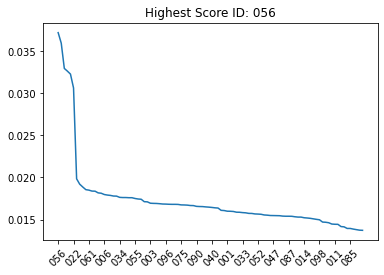

In [78]:
sim_tb1 = sim_tb1.sort_values(by='score', ascending=False)
ids1,scores1 = sim_tb1.values[:,0],sim_tb1.values[:,1]
plt.plot(ids1,scores1)
plt.xticks(np.arange(0,100,5),ids1[np.arange(0,100,5)],rotation = 45)
plt.title('Highest Score ID: '+ids1[0]);

scores_local = normalize_scores(scores1)

print("N  ID Scores NormScores")
[print(i+1, sim_tb1.iloc[i,0], f"{sim_tb1.iloc[i,1]:.5f}", f"{scores_local[i]:.5f}") for i in range(10)];

A good idea in this plot, where we cannot see one clear subject (as the first 6 subjects are all pretty close), is to take a look at the knee point for a score threshold. Also, let's normalize our scores in order to get a well generalized scale.

Knee at: 9	 Threshold:  0.20573406111835826


 With the threshold of 0.206, we can see a more clear divide between the subjects. However, the best 6 matches are all pretty close... We should be able to come up with a better discriminator by using a global similarity metric.

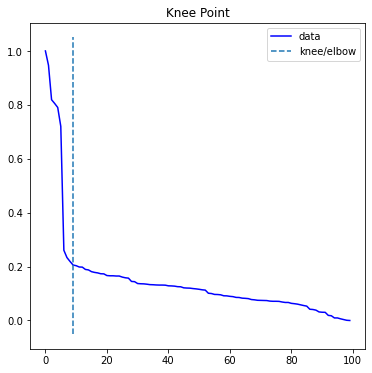

In [79]:
#Simple module to find the knee in a series
import kneed
from kneed import KneeLocator

kneedle1 = KneeLocator(list(range(len(ids1))),scores_local,S=1, curve='convex', direction='decreasing')
print(f'Knee at: {kneedle1.knee}\t Threshold: ',kneedle1.knee_y)
kneedle1.plot_knee()
Markdown(f" With the threshold of {kneedle1.knee_y:.3f}, we can see a more clear divide between the subjects. However, the best 6 matches are all pretty close... We should be able to come up with a better discriminator by using a global similarity metric." )

### 4. Model extension 2: Global similarity


**Global features**, here we use the matching keypoints to align the fingerprints, this allows us to compare the images as a whole (globally). Once the images are aligned we can take into account the distance between the key-points in the ambient space (the coordinates of the key-points). This is also referred to as geometrical distance since this is just comparing two points that are part of the intrinsic geometry of the object (no matter how you move the image around the point will move around with it and stay in the same location on the finger).

#### 4.1 Image alignment
[Here](https://www.learnopencv.com/image-alignment-feature-based-using-opencv-c-python/) you can find a description and code how to start from the brute force matching results and estimate the best transformation (from a family of transformations) that aligns the two images. In the example, a homography-type transformation is searched for. However, this has too many degrees of freedom for our application. We substituted this by a more constrained (only 4 degrees of freedom) similarity (partial affine) transformation.

These routines iteratively determine the minimal set of matching points that define a transformation that optimally aligns all other points as well, taking care of outliers at the same time. This method is a very general optimization technique and is called RANSAC, for "RANdom SAmple Consensus". See, apart from many other sources on the internet, [this presentation](http://www.cse.psu.edu/~rtc12/CSE486/lecture15.pdf) for further explanation. 

In [27]:
kp1 = kp1_orb
kp2 = kp2_orb
local_k1_k2_matches = local_k1_k2_matches_orb #update: we are only using orb features

def estimate_affine_transform_by_kps(src_pts, dst_pts):
    """
        Returns the Affine transformation that aligns two sets of points
    """
    transform_matrix, inliers = cv2.estimateAffinePartial2D(src_pts, dst_pts, 
                                           method =  cv2.RANSAC, 
                                           confidence = 0.9, 
                                           ransacReprojThreshold = 10.0, 
                                           maxIters = 5000, 
                                           refineIters = 10)
    return transform_matrix, inliers[:,0]

def warp_points(pts, M):
    mat_reg_points = cv2.transform(pts.reshape(-1,1,2), M)
    
    # return transformed keypoint list
    return cv2.KeyPoint.convert(mat_reg_points) 

def warp_img(img, M):
    return cv2.warpAffine(img, M, (img.shape[1], img.shape[0]))

# estimate the affine transform that aligns the matched keypoints
M, inliers = estimate_affine_transform_by_kps(
    cv2.KeyPoint.convert(np.array(kp1)[local_pt_source]), 
    cv2.KeyPoint.convert(np.array(kp2)[local_pt_target]))

kp1_reg = warp_points(cv2.KeyPoint.convert(kp1), M)
img1_reg = warp_img(images_enhanced_db[testNr1], M)

Let's have a look at how the images are alinged. Try visualizing different pairs of fingerprints! You may notice the estimated transform will be more extreme for images that are less similar, and will become more subtle as the images become more similar.

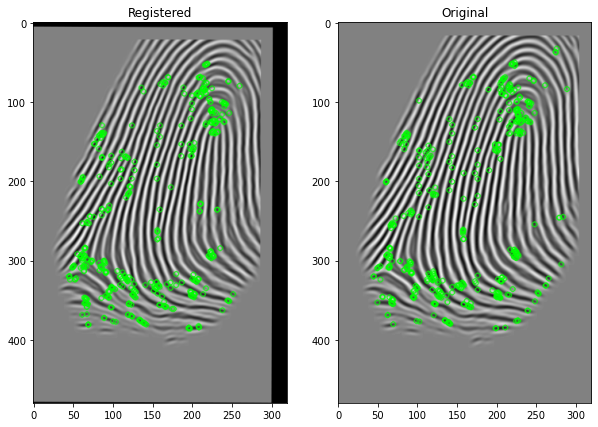

In [28]:
show_img1 = cv2.drawKeypoints(img1_reg, kp1_reg, None, (0, 255, 0), cv2.DRAW_MATCHES_FLAGS_DEFAULT)
show_img2 = cv2.drawKeypoints(images_enhanced_db[testNr2], kp2, None, (0, 255, 0), cv2.DRAW_MATCHES_FLAGS_DEFAULT)

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize=(10,10))
_=ax[0].imshow(show_img1), ax[1].imshow(show_img2),
ax[0].set_title("Registered"),ax[1].set_title("Original"),plt.show();

As you might have noticed the `estimateAffinePartial2D` function does not only return the transformation matrix but also the minimal set of matching points that were used to to determine the transformation. This gives us a better, more refined set of keypoints. 

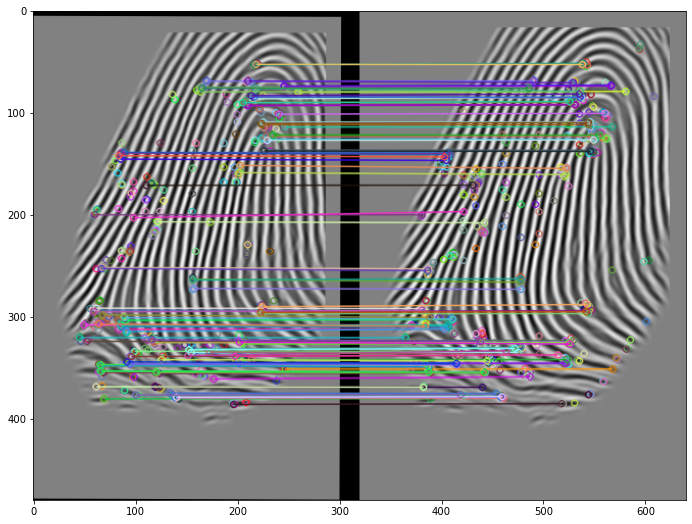

In [29]:
global_k1_k2_matches = local_k1_k2_matches[inliers == 1]

imMatches = cv2.drawMatches(img1_reg, kp1_reg, images_enhanced_db[testNr2], kp2, global_k1_k2_matches.tolist(), None)
_ = plt.imshow(imMatches)
f=plt.gcf()
f.set_size_inches(18,9), plt.show();

#### 4.2 Global Similarity Metric

<div class="alert alert-block alert-success">
<b>Q3: </b> Choose a global feature similarity function, (e.g. you can start from euclidean distance between the reduced sets of KeyPoints and count the values above a threshold).
</div>

In [30]:
def get_reduced_set(matches,reg_kp1,kp2):
    # get reduced keypoint set from matches
    reg_kp1 = cv2.KeyPoint_convert(reg_kp1)
    kp2 = cv2.KeyPoint_convert(kp2)
    kp1_reduced,kp2_reduced = [],[]
    for i in matches:
        kp1_reduced.append(reg_kp1[i.queryIdx])
        kp2_reduced.append(kp2[i.trainIdx])
    return kp1_reduced,kp2_reduced

In [31]:
from scipy.spatial import distance

def global_img_similarity(matches, reg_kp1, kp2): #euclidean distance
    
    red_kp1,red_kp2 = get_reduced_set(matches,reg_kp1,kp2) #get reduced keypoint set from matches
    
    eucl_distances = [] #list to save euclidean distances
    for x,y in zip(red_kp1,red_kp2):
        dist = distance.euclidean(x,y) #compute euclidean distance
        eucl_distances.append(dist)    #append to list of euclidean distances
    
    eucl_distances.sort()
    top_n = 10
    eucl_distances = eucl_distances[:top_n] #take n lower distances, as before in the given local function
    #eucl_distances = np.array(eucl_distances)
    eu_dist = 1/np.mean(eucl_distances+np.finfo(float).eps) #add this small factor as before to avoid division by 0
    
    return eu_dist


In [32]:
def global_similarity(masked_fp1, masked_fp2, detector=cv2.ORB_create(), kp_erosion_ksize = (5,5)):
    # separate the semgentation from the image
    fp1, mask1 = masked_fp1[...,0], masked_fp1[...,1] 
    fp2, mask2 = masked_fp2[...,0], masked_fp2[...,1] 
    
    # detect the keypoints
    kp1 = detect_keypoints(fp1, mask1, detector, kernel_size = kp_erosion_ksize)
    kp2 = detect_keypoints(fp2, mask2, detector, kernel_size = kp_erosion_ksize)
    
    # compute descriptor for each keypoints
    kp1, local_des1 = compute_local_descriptor(fp1, kp1, detector)
    kp2, local_des2 = compute_local_descriptor(fp2, kp2, detector)
    
    # find matches between keypoints based on local feature descriptor
    local_k1_k2_matches = brute_force_matcher(local_des1, local_des2, cv2.NORM_HAMMING)
    
    # get source and target index for each match
    local_pt_source, local_pt_target = np.array([
        (match.queryIdx, match.trainIdx) for match in local_k1_k2_matches]).T
    
    # use matching keypoints to estimate an affine transform between keypoints
    M, inliers = estimate_affine_transform_by_kps(
        cv2.KeyPoint.convert(kp1[local_pt_source]), 
        cv2.KeyPoint.convert(kp2[local_pt_target]))
    
    # if no inliers can be found
    if M is None: 
        return 0
    
    # warp the keypoints according to the found transform
    kp1_reg = warp_points(cv2.KeyPoint.convert(kp1), M)
    
    # subset the keypoints, inliers are considered good keypoints
    # since they were used in finding the transformation
    global_k1_k2_matches = local_k1_k2_matches[inliers == 1]
    
    # compute global similarity based aligned matching global keypoints
    return global_img_similarity(global_k1_k2_matches,kp1_reg, kp2)
 

In [80]:
# Run now with global similarity function
sim_tb2 = constructSimilarityTable(np.stack((perp_img_en,perp_img_mask),-1), np.stack((images_segmented_db,masks_db),-1), 
                                   labels_db, global_similarity)
print(sim_tb2)

     id     score
0   001  0.226647
1   002  0.201764
2   003  0.210765
3   004  0.244418
4   005  0.292289
..  ...       ...
95  096  0.206765
96  097  0.235797
97  098  0.204744
98  099  0.280608
99  100  0.409738

[100 rows x 2 columns]


<div class="alert alert-block alert-success">
<b>Q4: </b> Visualize the scores and determine a score threshold to discriminate the matching fingerprints. Explain how you determine the threshold.
</div>

N  ID Scores NormScores
1 056 4.90687 1.00000
2 018 4.49901 0.91416
3 076 3.99609 0.80832
4 048 3.15881 0.63211
5 049 3.12076 0.62410
6 022 2.00617 0.38952
7 034 0.44408 0.06077
8 028 0.43438 0.05873
9 062 0.42897 0.05759
10 040 0.42607 0.05698


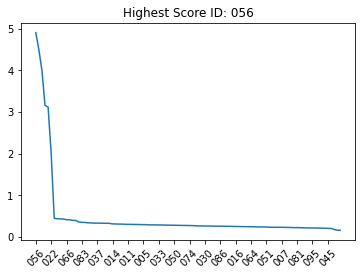

In [81]:
# Same as in similarity table 1 for local similarity
sim_tb2 = sim_tb2.sort_values(by='score', ascending=False)
ids2,scores2 = sim_tb2.values[:,0],sim_tb2.values[:,1]
plt.plot(ids2,scores2)
plt.xticks(np.arange(0,100,5),ids2[np.arange(0,100,5)],rotation = 45)
plt.title('Highest Score ID: '+ids2[0]);

scores_global = normalize_scores(scores2) 

print("N  ID Scores NormScores")
[print(i+1, sim_tb2.iloc[i,0], f"{sim_tb2.iloc[i,1]:.5f}", f"{scores_global[i]:.5f}") for i in range(10)];

Knee at: 6	 Threshold:  0.060768803056006175


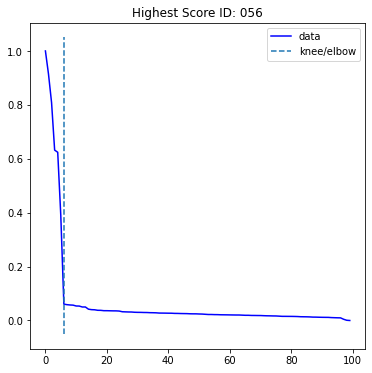

In [144]:
#Find knee again, normalize as with local similarity scores

kneedle2 = KneeLocator(list(range(len(ids2))),scores_global,S=1, curve='convex', direction='decreasing')
print(f'Knee at: {kneedle2.knee}\t Threshold: ',kneedle2.knee_y)
kneedle2.plot_knee()
plt.title('Highest Score ID: '+ids2[0]);

### 5. Model extension 3: Hybrid features


Since we again run into the same problem of a lack of clear disctinction, we can now give hybrid features a shot.

#### 5.1 Hybrid Similarity metric
<div class="alert alert-block alert-success">
<b>Q5: </b> Choose a hybrid feature similarity function that makes use of both the geometric distance and the feature distance of the keypoints. Using this hybrid function, visualize and assess the matches.
</div>

In [36]:
def hybrid_img_similarity(matches, kp1_reg, kp2):
    # we must consider two metrics and weight them
    
    # firstly, from local similarity (previously done)
    dist = [i.distance for i in matches]
    dist.sort()
    top_n = 30
    best_n_matches = dist[:top_n]    
    local_score =1/(np.mean(best_n_matches)+np.finfo(float).eps) 
    
    # secondly, from global similarity (already done too): in this case euclidean_dist, the one we chose before
    red_kp1,red_kp2 = get_reduced_set(matches,kp1_reg,kp2)    
    eucl_distances = [] 
    for x,y in zip(red_kp1,red_kp2):
        dist = distance.euclidean(x,y) 
        eucl_distances.append(dist)      
    eucl_distances.sort()
    top_n = 30
    eucl_distances = eucl_distances[:top_n] 
    
    global_score = 1 / np.mean(eucl_distances+np.finfo(float).eps) 
    
    # finally, combine both scores in an hybrid score
    #hybrid_score = (local_score * global_score) #scale factor
    hybrid_score = 2 / (1/local_score + 1/global_score)
    
    return hybrid_score

#### 5.2 Construct hybrid similarity matrix


In [37]:
def hybrid_similarity(masked_fp1, masked_fp2, detector=cv2.ORB_create(), kp_erosion_ksize = (5,5)):
    # separate the semgentation from the image
    fp1, mask1 = masked_fp1[...,0], masked_fp1[...,1] 
    fp2, mask2 = masked_fp2[...,0], masked_fp2[...,1] 
    
    # detect the keypoints
    kp1 = detect_keypoints(fp1, mask1, detector, kernel_size=kp_erosion_ksize)
    kp2 = detect_keypoints(fp2, mask2, detector, kernel_size= kp_erosion_ksize)
    
    # compute descriptor for each keypoints
    kp1, local_des1 = compute_local_descriptor(fp1, kp1, detector)
    kp2, local_des2 = compute_local_descriptor(fp2, kp2, detector)
    
    # find matches between keypoints based on local feature descriptor
    local_k1_k2_matches = brute_force_matcher(local_des1, local_des2, cv2.NORM_HAMMING)
    
    # get source and target index for each match
    local_pt_source, local_pt_target = np.array([
        (match.queryIdx, match.trainIdx) for match in local_k1_k2_matches]).T
    
    # use matching keypoints to estimate an affine transform between keypoints
    M, inliers = estimate_affine_transform_by_kps(
        cv2.KeyPoint.convert(kp1[local_pt_source]), 
        cv2.KeyPoint.convert(kp2[local_pt_target]))
    
    # if no inliers can be found
    if M is None: 
        return 0
    
    # warp the keypoints according to the found transform
    kp1_reg = warp_points(cv2.KeyPoint.convert(kp1), M)
    
    # subset the keypoints, inliers are considered good keypoints
    # since they were used in finding the transformation
    global_k1_k2_matches = local_k1_k2_matches[inliers == 1]

     # compute hybrid similarity based on aligned matching keypoints
    return hybrid_img_similarity(global_k1_k2_matches, kp1_reg, kp2)
    

In [82]:
# Run now with hybrid similarity function
sim_tb3 = constructSimilarityTable(np.stack((perp_img_en,perp_img_mask),-1), np.stack((images_segmented_db,masks_db),-1), labels_db, hybrid_similarity)
print(sim_tb3)

     id     score
0   001  0.020852
1   002  0.021886
2   003  0.020482
3   004  0.022003
4   005  0.021173
..  ...       ...
95  096  0.023152
96  097  0.023520
97  098  0.021514
98  099  0.022024
99  100  0.022336

[100 rows x 2 columns]


N  ID Scores NormScores
1 056 0.07260 1.00000
2 049 0.06840 0.91965
3 018 0.06261 0.80913
4 048 0.06106 0.77958
5 076 0.06046 0.76800
6 022 0.05910 0.74214
7 075 0.02546 0.09944
8 024 0.02522 0.09478
9 033 0.02493 0.08924
10 043 0.02465 0.08386


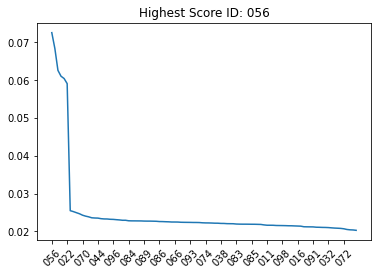

In [39]:
# As before, reorder
sim_tb3 = sim_tb3.sort_values(by='score', ascending=False)
ids3,scores3 = sim_tb3.values[:,0],sim_tb3.values[:,1]
plt.plot(ids3,scores3)
plt.xticks(np.arange(0,100,5),ids3[np.arange(0,100,5)],rotation = 45)
plt.title('Highest Score ID: '+ids3[0]);

scores_hybrid = normalize_scores(scores3) 

print("N  ID Scores NormScores")
[print(i+1, sim_tb3.iloc[i,0], f"{sim_tb3.iloc[i,1]:.5f}", f"{scores_hybrid[i]:.5f}") for i in range(10)];

Knee at: 6	 Threshold:  0.09943718939112732


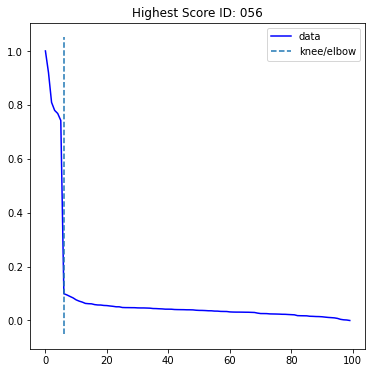

In [143]:
# Same as before for hybrid scores 
kneedle3 = KneeLocator(list(range(len(ids3))),scores_hybrid,S=1, curve='convex', direction='decreasing')
print(f'Knee at: {kneedle3.knee}\t Threshold: ',kneedle3.knee_y)
kneedle3.plot_knee()
plt.title('Highest Score ID: '+ids3[0]);

Oh no! Still no clear distinction... This is suspicious, let's take a look at the best matching fingerprints.

Best matching fingerprints IDs: ['056', '049', '018', '048', '076', '022']


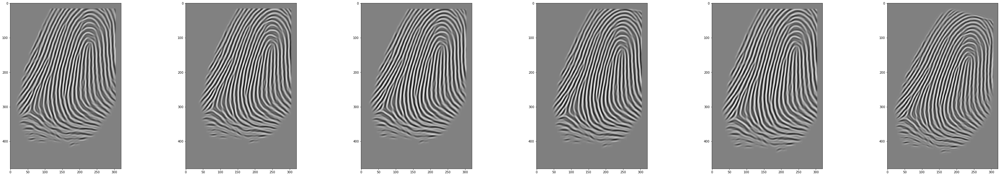

In [83]:
best_matching_fg = []
def get_image_by_label(ind):
    for i in range(len(labels_db)):
        if labels_db[i] == ind: 
            best_matching_fg.append(labels_db[i])
            return images_enhanced_db[i]
    raise ValueError("No image with this label is found.")

imgs = [get_image_by_label(i) for i in ids3[:kneedle3.knee]]
#visualize the ids and images of these fingerprints
print("Best matching fingerprints IDs:",best_matching_fg)
plot_image_sequence(imgs,kneedle3.knee if kneedle3.knee<=7 else 7)

The top matching subjects all have the same fingerprint! The murderer must have hacked the database and replicated some of the images, effectively covering their tracks. They seem to be one step ahead all the time... Or so they think! Fingerprints are not the only biometric you can evaluate.

You call your friends at CSI New York and send them the video surveillance records. By making use of the revolutionary (and non-existent) technology of ***zoom-and-enhance***, they return to you a database of iris images.

![Zoom and Enhance](img/csi_zoom_enhance.gif)

## III. Iris recognition
Now let's create a biometric system for the iris data. 

### 1. Reading data

<div class="alert alert-block alert-success">
<b>Q6: </b> Check out <code>iris_perpetrator.png</code>. Where do you see difficulties? What kind of similarity measures do you expect to work best?
</div>

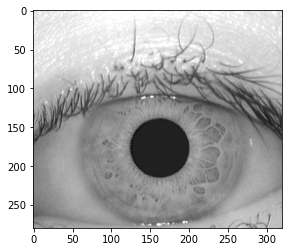

In [84]:
# set path
iris_data_path = 'data//CASIA1'

iris_perpetrator = cv2.cvtColor(cv2.imread("perpetrator_iris.bmp"),cv2.COLOR_BGR2GRAY)
plt.imshow(iris_perpetrator,cmap='gray');

Let's read the iris data... The images are stored as XXX.png, where XXX stands for the unique identifier of subject, ranging from from 000 to 100.

In [85]:
def read_iris_DB(path):
    images = []
    labels = []
    imagePaths = sorted(os.listdir('data//CASIA1//')) #mac!

    for imagePath in imagePaths:
        if imagePath.endswith('.png'):
            label = imagePath.split('.')[0]
            image = cv2.imread(path +'//' + imagePath) #mac

            if (len(image.shape) > 2):
                image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

            images.append(image)
            labels.append(label)

    return np.array(images), np.array(labels)

# read iris Database
iris_images, iris_labels = read_iris_DB(iris_data_path)

# save data properties
n_images = len(iris_images)
img_height, img_width = iris_images[0].shape[0], iris_images[0].shape[1]

Markdown("""
Let's have a look at the dataset... It contains {} images of size of the images is {}×{}. Let's visualise the first 7:
""".format(n_images,img_height,img_width))


Let's have a look at the dataset... It contains 100 images of size of the images is 280×320. Let's visualise the first 7:


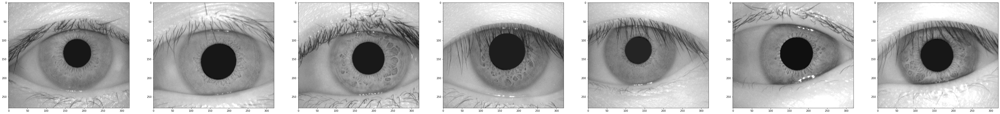

In [86]:
n = 7
plot_image_sequence(iris_images, n)

### 2. Biometric iris recognition System
#### 2.1. Image enhancement
Similar to the image enhancement in the [fingerprints](#3.1.-Image-enhancements) section, we will use [open source code](https://github.com/thuyngch/Iris-Recognition) to segment (based on Daugman's intefro-differential) and normalise (by unwraping the circular region) the iris images. We strongly encourage you to go through the source code or github repository to learn more. 

Also similar to the fingerprint section we enhance the images using a gabor filter bank, this time we implement this using [OpenCV](https://docs.opencv.org/3.4/d4/d86/group__imgproc__filter.html#gae84c92d248183bd92fa713ce51cc3599). 

In [87]:
import warnings
warnings.filterwarnings('ignore')

from src.irismodules.iris_recognition.python.fnc import segment, normalize

# we use the same hyper parameters as in the enroll-casia1.py example
# feel free to play around with these!
eyelashes_thres = 150
radial_res = 200
angular_res = 500

def segment_iris(img):
    # Segment the iris region from the eye image. Indicate the noise region.
    ciriris, cirpupil, imwithnoise = segment.segment(img)

    # Normalize iris region by unwraping the circular region into a rectangular block of constant dimensions.
    polar_iris, mask = normalize.normalize(
        imwithnoise, ciriris[1], ciriris[0], ciriris[2], cirpupil[1], cirpupil[0], cirpupil[2], radial_res, angular_res)
    
    return polar_iris, (mask == 0)      

def get_filter_bank(ksize = 5,sigma = 4, theta_range = np.arange(0,np.pi,np.pi/16), lambd=10,gamma = 0.5,psi=0 ):
    # this filterbank comes from https://cvtuts.wordpress.com/
    filters = []
    for theta in theta_range:
        kern = cv2.getGaborKernel((ksize, ksize), sigma, theta, lambd, gamma, psi, ktype=cv2.CV_32F)
        kern /= 1.5*kern.sum()
        filters.append(kern)
    return filters
    cv2.getGaborKernel()
def enhance_iris(img, eps = 1.e-15, agg_f = np.max):
    # get the gabor filters
    filters = get_filter_bank()

    # apply filters to image
    enhanced_image = np.array([cv2.filter2D(img, ddepth = -1, kernel=k) for k in filters])
    
    # Normalize in the [0,255] range
    enhanced_image = cv2.normalize(enhanced_image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=0)
    
    # aggregate features
    return agg_f(enhanced_image,0)
    
def enhance_and_segment_irises(images):
    enhanced_images, masks = [], []
    for img in tqdm_notebook(images):
        normalised_img, mask = segment_iris(img)
        enhanced_img = enhance_iris(normalised_img)
        
        masks.append(mask)
        enhanced_images.append(enhanced_img)
    
    return np.array(enhanced_images), np.array(masks)

try:
    with open("db_pkl/iris_mask_db.pkl","rb") as f:
        enhanced_iris,mask_iris = pickle.load(f)
except:
    enhanced_iris, mask_iris = enhance_and_segment_irises(iris_images)
    with open("db_pkl/iris_mask_db.pkl","wb") as f:
        pickle.dump([enhanced_iris,mask_iris],f)
    

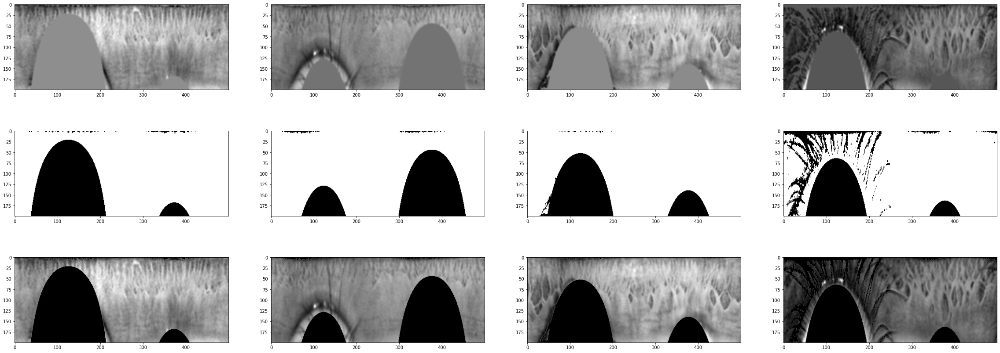

In [88]:
n=4

iris_segmented_db = np.array([a*b for a,b in zip(enhanced_iris, mask_iris)])
plot_image_sequence(enhanced_iris.tolist()[:n] + mask_iris.tolist()[:n] + iris_segmented_db.tolist()[:n], 3*n, n, figsize= (10,5), cmap='gray')

<div class="alert alert-block alert-success">
<b>Q7: </b> Construct a similarity table with the iris images. Use local OR global matches in order to get scores. Use the scores you get to determine the perpetrator.
</div>

In [89]:
#Do not forget to apply the same preprocessing to the perpretator image !!! as before
perp_img_en_iris, perp_img_mask_iris = enhance_and_segment_irises([iris_perpetrator])
perp_img_en_iris = perp_img_en_iris[0]
perp_img_mask_iris = perp_img_mask_iris[0]

  0%|          | 0/1 [00:00<?, ?it/s]

# IRIS: Exercise D from additional tasks of the assignment is included here.

#### We are first going to use LOCAL matches to get scores and try to determine the perpetrator. We use the same metric than before in the fingerprint task. Then we are going to extract the same with global matches and use hybrid matches to compare all of them (EXERCISE D FROM ADDITIONAL TASKS OF THE ASSIGNMENT)

In [111]:
def local_img_similarity_iris(matches):
    # firstly, from local similarity (previously done)
    dist = [i.distance for i in matches]
    dist.sort()
    top_n = 30
    best_n_matches = dist[:top_n]    
    local_score =1/(np.mean(best_n_matches)+np.finfo(float).eps)
    return local_score

def similarity_iris_1(masked_fp1, masked_fp2, detector=cv2.ORB_create(), kp_erosion_ksize = (5,5)):
    # separate the semgentation from the image
    fp1, mask1 = masked_fp1[...,0], masked_fp1[...,1] 
    fp2, mask2 = masked_fp2[...,0], masked_fp2[...,1] 
    
    # detect the keypoints
    kp1 = detect_keypoints(fp1, mask1, detector, kernel_size = kp_erosion_ksize)
    kp2 = detect_keypoints(fp2, mask2, detector, kernel_size = kp_erosion_ksize)
    
    # compute descriptor for each keypoints
    kp1, local_des1 = compute_local_descriptor(fp1, kp1, detector)
    kp2, local_des2 = compute_local_descriptor(fp2, kp2, detector)
    
    # find matches between keypoints based on local feature descriptor
    local_k1_k2_matches = brute_force_matcher(local_des1, local_des2, cv2.NORM_HAMMING)
    
    # compute global similarity based aligned matching global keypoints
    return local_img_similarity_iris(local_k1_k2_matches)
    

In [112]:
# Run now with global similarity function
sim_tb4_1 = constructSimilarityTable(np.stack((perp_img_en_iris,perp_img_mask_iris),-1), 
                                   np.stack((enhanced_iris, mask_iris),-1), 
                                   iris_labels, similarity_iris_1)
print(sim_tb4_1)

     id     score
0   001  0.015408
1   002  0.014948
2   003  0.036810
3   004  0.015641
4   005  0.013471
..  ...       ...
95  096  0.016384
96  097  0.017143
97  098  0.015814
98  099  0.016438
99  100  0.013514

[100 rows x 2 columns]


N  ID Scores NormScores
1 036 0.06772 1.00000
2 063 0.06198 0.89506
3 093 0.05929 0.84576
4 091 0.05929 0.84576
5 025 0.05017 0.67890
6 010 0.04060 0.50380
7 088 0.03681 0.43455
8 003 0.03681 0.43455
9 056 0.03264 0.35835
10 034 0.03000 0.30998


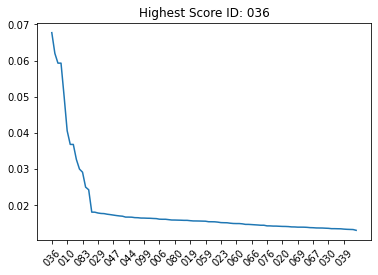

In [118]:
# Same as in similarity table 1 for local similarity
sim_tb4_1 = sim_tb4_1.sort_values(by='score', ascending=False)
ids4_1,scores4_1 = sim_tb4_1.values[:,0],sim_tb4_1.values[:,1]
plt.plot(ids4_1,scores4_1)
plt.xticks(np.arange(0,100,5),ids4_1[np.arange(0,100,5)],rotation = 45)
plt.title('Highest Score ID: '+ids4_1[0]);

scores_iris_1 = normalize_scores(scores4_1) 

print("N  ID Scores NormScores")
[print(i+1, sim_tb4_1.iloc[i,0], f"{sim_tb4_1.iloc[i,1]:.5f}",f"{scores_iris_1[i]:.5f}") for i in range(10)];

Knee at: 2	 Threshold:  0.8457603102393916


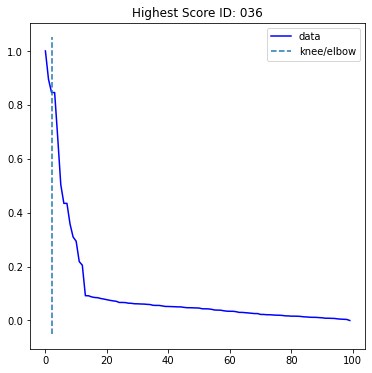

In [135]:
kneedle4_1 = KneeLocator(list(range(len(ids4_1))),np.array(scores_iris_1),S=1, curve='convex', direction='decreasing')
print(f'Knee at: {kneedle4_1.knee}\t Threshold: ',kneedle4_1.knee_y) 
kneedle4_1.plot_knee()
plt.title('Highest Score ID: '+ids4_1[0]);

#### Now we look for the other ways of extracting the scores: global and hybrid scores.

In [145]:
def global_img_similarity_iris(matches, reg_kp1, kp2): #euclidean distance, SAME AS BEFORE
    
    red_kp1,red_kp2 = get_reduced_set(matches,reg_kp1,kp2) #get reduced keypoint set from matches
    
    eucl_distances = [] #list to save euclidean distances
    for x,y in zip(red_kp1,red_kp2):
        dist = distance.euclidean(x,y) #compute euclidean distance
        eucl_distances.append(dist)    #append to list of euclidean distances
    
    eucl_distances.sort()
    top_n = 30
    eucl_distances = eucl_distances[:top_n] #take n lower distances, as before in the given local function

    global_score = 1/np.mean(eucl_distances+np.finfo(float).eps) #add this small factor as before to avoid division by 0
       
    return global_score

# FOR EXERCISE D FROM THE ADDITIONAL TASKS OF THE ASSIGNMENT
def hybrid_img_similarity_iris(matches, kp1_reg, kp2):
    """Exactly the same as previously done for the fingerprint 
    hybrid similarity function"""
    
    # firstly, from local similarity 
    dist = [i.distance for i in matches]
    dist.sort()
    top_n = 30
    best_n_matches = dist[:top_n]    
    local_score =1/(np.mean(best_n_matches)+np.finfo(float).eps)
    
    # secondly, from global similarity: in this case euclidean_dist
    red_kp1,red_kp2 = get_reduced_set(matches,kp1_reg,kp2) #get reduced keypoint set from matches   
    eucl_distances = [] 
    for x,y in zip(red_kp1,red_kp2):
        dist = distance.euclidean(x,y) #compute euclidean distance
        eucl_distances.append(dist)    
    
    eucl_distances.sort()
    top_n = 30
    eucl_distances = eucl_distances[:top_n] 
    #eucl_distances = np.array(eucl_distances) 
    global_score = 1 / np.mean(eucl_distances+np.finfo(float).eps) 
    
    # finally, combine both scores in an hybrid score (CHOOSE ONE)
    hybrid_score = 2 / (1/local_score + 1/global_score) 
    #hybrid_score = (local_score * global_score) #scale factor
    
    return hybrid_score

In [146]:
def similarity_iris_2(masked_fp1, masked_fp2, detector=cv2.ORB_create(), kp_erosion_ksize = (5,5)):
    # separate the semgentation from the image
    fp1, mask1 = masked_fp1[...,0], masked_fp1[...,1] 
    fp2, mask2 = masked_fp2[...,0], masked_fp2[...,1] 
    
    # detect the keypoints
    kp1 = detect_keypoints(fp1, mask1, detector, kernel_size = kp_erosion_ksize)
    kp2 = detect_keypoints(fp2, mask2, detector, kernel_size = kp_erosion_ksize)
    
    # compute descriptor for each keypoints
    kp1, local_des1 = compute_local_descriptor(fp1, kp1, detector)
    kp2, local_des2 = compute_local_descriptor(fp2, kp2, detector)
    
    # find matches between keypoints based on local feature descriptor
    local_k1_k2_matches = brute_force_matcher(local_des1, local_des2, cv2.NORM_HAMMING)
    
    # get source and target index for each match
    local_pt_source, local_pt_target = np.array([
        (match.queryIdx, match.trainIdx) for match in local_k1_k2_matches]).T
    
    # use matching keypoints to estimate an affine transform between keypoints
    M, inliers = estimate_affine_transform_by_kps(
        cv2.KeyPoint.convert(kp1[local_pt_source]), 
        cv2.KeyPoint.convert(kp2[local_pt_target]))
    
    # if no inliers can be found
    if M is None: 
        return 0
    
    # warp the keypoints according to the found transform
    kp1_reg = warp_points(cv2.KeyPoint.convert(kp1), M)
    
    # subset the keypoints, inliers are considered good keypoints
    # since they were used in finding the transformation
    global_k1_k2_matches = local_k1_k2_matches[inliers == 1]
    
    # compute global similarity based aligned matching global keypoints
    return global_img_similarity_iris(global_k1_k2_matches,kp1_reg, kp2)
    

# EXACTLY THE SAME BUT FOR HYBRID
def similarity_iris_3(masked_fp1, masked_fp2, detector=cv2.ORB_create(), kp_erosion_ksize = (5,5)):
    # separate the semgentation from the image
    fp1, mask1 = masked_fp1[...,0], masked_fp1[...,1] 
    fp2, mask2 = masked_fp2[...,0], masked_fp2[...,1] 
    
    # detect the keypoints
    kp1 = detect_keypoints(fp1, mask1, detector, kernel_size = kp_erosion_ksize)
    kp2 = detect_keypoints(fp2, mask2, detector, kernel_size = kp_erosion_ksize)
    
    # compute descriptor for each keypoints
    kp1, local_des1 = compute_local_descriptor(fp1, kp1, detector)
    kp2, local_des2 = compute_local_descriptor(fp2, kp2, detector)
    
    # find matches between keypoints based on local feature descriptor
    local_k1_k2_matches = brute_force_matcher(local_des1, local_des2, cv2.NORM_HAMMING)
    
    # get source and target index for each match
    local_pt_source, local_pt_target = np.array([
        (match.queryIdx, match.trainIdx) for match in local_k1_k2_matches]).T
    
    # use matching keypoints to estimate an affine transform between keypoints
    M, inliers = estimate_affine_transform_by_kps(
        cv2.KeyPoint.convert(kp1[local_pt_source]), 
        cv2.KeyPoint.convert(kp2[local_pt_target]))
    
    # if no inliers can be found
    if M is None: 
        return 0
    
    # warp the keypoints according to the found transform
    kp1_reg = warp_points(cv2.KeyPoint.convert(kp1), M)
    
    # subset the keypoints, inliers are considered good keypoints
    # since they were used in finding the transformation
    global_k1_k2_matches = local_k1_k2_matches[inliers == 1]
    
    return hybrid_img_similarity_iris(global_k1_k2_matches,kp1_reg, kp2)  

In [147]:
# Run now with global similarity function
sim_tb4_2 = constructSimilarityTable(np.stack((perp_img_en_iris,perp_img_mask_iris),-1), 
                                   np.stack((enhanced_iris, mask_iris),-1), 
                                   iris_labels, similarity_iris_2)
print(sim_tb4_2)

     id     score
0   001  0.217792
1   002  0.233320
2   003  1.723843
3   004  0.209030
4   005  0.218716
..  ...       ...
95  096  0.191687
96  097  0.272730
97  098  0.190289
98  099  0.195824
99  100  0.241663

[100 rows x 2 columns]


N  ID Scores NormScores
1 035 92681.90161 1.00000
2 077 7084.97297 0.07644
3 085 4.53194 0.00005
4 063 2.39076 0.00003
5 025 2.30684 0.00002
6 036 2.26147 0.00002
7 070 2.01245 0.00002
8 003 1.72384 0.00002
9 088 1.72384 0.00002
10 073 1.58891 0.00002


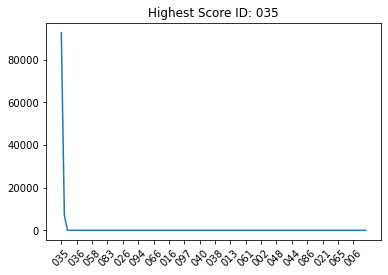

In [148]:
# Same as in similarity table 1 for local similarity
sim_tb4_2 = sim_tb4_2.sort_values(by='score', ascending=False)
ids4_2,scores4_2 = sim_tb4_2.values[:,0],sim_tb4_2.values[:,1]
plt.plot(ids4_2,scores4_2)
plt.xticks(np.arange(0,100,5),ids4_2[np.arange(0,100,5)],rotation = 45)
plt.title('Highest Score ID: '+ids4_2[0]);

scores_iris_2 = normalize_scores(scores4_2) 

print("N  ID Scores NormScores")
[print(i+1, sim_tb4_2.iloc[i,0], f"{sim_tb4_2.iloc[i,1]:.5f}",f"{scores_iris_2[i]:.5f}") for i in range(10)];

Knee at: 2	 Threshold:  4.8897745849225266e-05


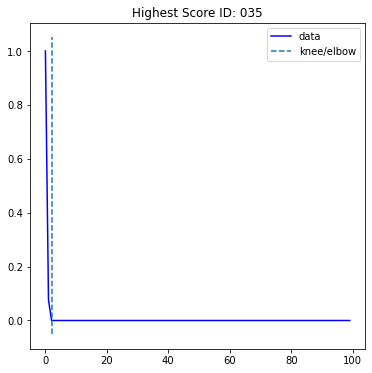

In [149]:
# Place knee in normalized graphic
kneedle4_2 = KneeLocator(list(range(len(ids4_2))),np.array(scores_iris_2),S=1, curve='convex', direction='decreasing')
print(f'Knee at: {kneedle4_2.knee}\t Threshold: ',kneedle4_2.knee_y) 
kneedle4_2.plot_knee()
plt.title('Highest Score ID: '+ids4_2[0]);

In [150]:
# Run now with HYBRID similarity function
sim_tb4_3 = constructSimilarityTable(np.stack((perp_img_en_iris,perp_img_mask_iris),-1), 
                                   np.stack((enhanced_iris, mask_iris),-1), 
                                   iris_labels, similarity_iris_3)
print(sim_tb4_3)

     id     score
0   001  0.024265
1   002  0.025794
2   003  0.072080
3   004  0.023589
4   005  0.023327
..  ...       ...
95  096  0.026840
96  097  0.033645
97  098  0.023927
98  099  0.026366
99  100  0.021897

[100 rows x 2 columns]


N  ID Scores NormScores
1 036 0.13150 1.00000
2 063 0.11417 0.86817
3 093 0.11066 0.84151
4 091 0.11066 0.84151
5 025 0.09820 0.74675
6 010 0.07848 0.59683
7 088 0.07208 0.54813
8 003 0.07208 0.54813
9 083 0.06551 0.49816
10 056 0.06134 0.46647


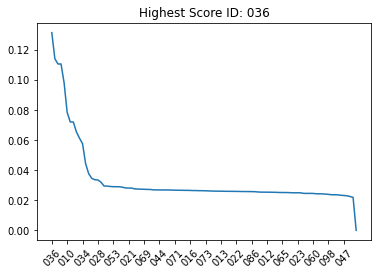

In [131]:
sim_tb4_3 = sim_tb4_3.sort_values(by='score', ascending=False)
ids4_3,scores4_3 = sim_tb4_3.values[:,0],sim_tb4_3.values[:,1]
plt.plot(ids4_3,scores4_3)
plt.xticks(np.arange(0,100,5),ids4_3[np.arange(0,100,5)],rotation = 45)
plt.title('Highest Score ID: '+ids4_3[0]);

scores_iris_3 = normalize_scores(scores4_3) 

print("N  ID Scores NormScores")
[print(i+1, sim_tb4_3.iloc[i,0], f"{sim_tb4_3.iloc[i,1]:.5f}",f"{scores_iris_3[i]:.5f}") for i in range(10)];

Knee at: 13	 Threshold:  0.2627263494186449


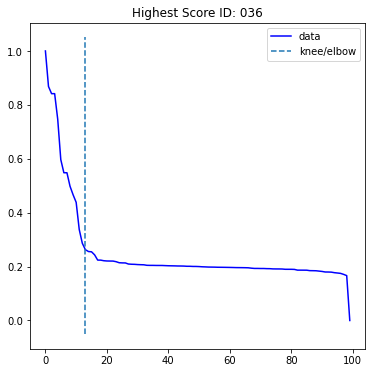

In [134]:
# Place knee in normalized graphic
kneedle4_3 = KneeLocator(list(range(len(ids4_3))),np.array(scores_iris_3),S=1, curve='convex', direction='decreasing')
print(f'Knee at: {kneedle4_3.knee}\t Threshold: ',kneedle4_3.knee_y) 
kneedle4_3.plot_knee()
plt.title('Highest Score ID: '+ids4_3[0]);

How is this possible? Iris scans don't provide a clear suspect either. 

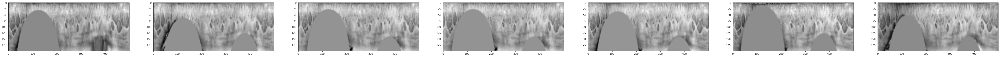

In [137]:
def get_iris_image_by_label(ind):
    for i in range(len(iris_labels)):
        if iris_labels[i] == ind:
            
            return enhanced_iris[i]
    raise ValueError("No image with this label is found.")

imgs = [get_iris_image_by_label(i) for i in ids4[:kneedle4.knee]]
plot_image_sequence(imgs,kneedle4.knee if kneedle4.knee<=7 else 7)

They are all the same once again. There is no doubt about it now, there is an insider messing with the data! Lucky for us, but unlucky for them, they slipped up. We can now construct a multimodal biometric system in order to catch the perpetrator.

## IV Multimodal System

<div class="alert alert-block alert-success">
<b>Q8: </b> Fuse your iris and fingerprint biometric system on the score level to solve the murder case! Do you feel confident in your prediction? How do you fuse the scores? Why?
</div>

In [151]:
# Function to calculate the average between the two systems
def fuse_similarities(scores_fp,scores_iris):
    avg_similarity = [] #list where save avg scores
    for x,y in zip(scores_fp,scores_iris):
        #avg_score = np.mean([x,y])
        avg_score = x * y
        avg_similarity.append(avg_score)       
    avg_similarity = np.array(avg_similarity)
    
    return avg_similarity

# Retrieve scores from fingerprint biometric system
scores_fp = sim_tb3.sort_values(by='id',ascending=True).score
scores_fp = scores_fp.values 
#print(scores_fp)
# Retrieve scores from iris biometric system
scores_iris = sim_tb4.sort_values(by='id',ascending=True).score
scores_iris = scores_iris.values
#print(scores_iris)
# Check that shapes match
assert scores_fp.shape == scores_iris.shape, 'Both score arrays should have same shape'


In [152]:
# We need normalization of the scores as before
scores_fp = normalize_scores(scores_fp)
scores_iris = normalize_scores(scores_iris)

multi_scores = fuse_similarities(scores_fp,scores_iris)

sim_tb_multi = sim_tb3.sort_values(by='id',ascending=True).copy()
sim_tb_multi.score = multi_scores
#sim_tb_multimodal

N ID   Score  NormScores
1 056 0.46647 1.00000
2 049 0.17740 0.38031
3 018 0.16720 0.35844
4 076 0.15402 0.33019
5 048 0.15300 0.32799
6 022 0.14611 0.31323
7 025 0.04282 0.09179
8 010 0.04070 0.08726
9 093 0.03375 0.07236
10 088 0.02603 0.05581


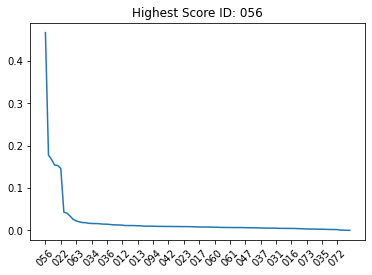

In [157]:
sim_tb_multi = sim_tb_multi.sort_values(by='score', ascending=False)
ids_multi,scores_multi = sim_tb_multi.values[:,0],sim_tb_multi.values[:,1]
plt.plot(ids_multi,scores_multi)
plt.xticks(np.arange(0,100,5),ids_multi[np.arange(0,100,5)],rotation = 45)
plt.title('Highest Score ID: '+ids_multi[0]);

scores_multi_norm = normalize_scores(scores_multi)
print('N ID   Score  NormScores')
[print(i+1,sim_tb_multi.iloc[i,0],f"{sim_tb_multi.iloc[i,1]:.5f}",f"{scores_multi_norm[i]:.5f}") for i in range(10)];


Knee at: 9	 Treshold:  0.026032604013855806


Threshold of  0.026

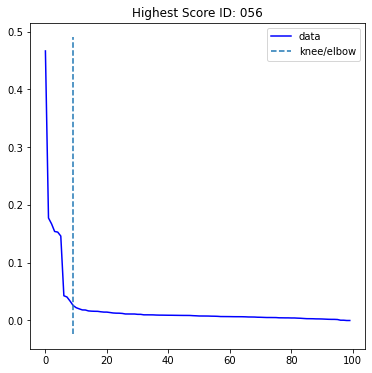

In [155]:
kneedle_multi = KneeLocator(list(range(len(ids_multi))),scores_multi,S=1, curve='convex', direction='decreasing')
print(f'Knee at: {kneedle_multi.knee}\t Treshold: ',kneedle_multi.knee_y) 
kneedle_multi.plot_knee()
plt.title('Highest Score ID: '+ids_multi[0]);
Markdown(f"Threshold of  {kneedle_multi.knee_y:.3f}" )


## V. Assignment Instructions
Both a report and the implementation in this notebook have to be submitted to toledo. <u>The notebook functions as supplementary material only!</u> The report should be self contained. Feel free to add figures, code and mathematics in the report if you feel comfortable. Try to be concice and to the point and try keep your report below 10 pages. 

1. Follow the instructions in the notebook and discuss results/impact in your report.
2. <b>Choose a number of tasks equivalent to <u>at least 6pts</u> from the list below (pts are not related to the grades): </b>
    1. [FING and IRIS] OpenCV provides different KeyPoint detectors and descriptors (ORB, SIFT, SURF, BRIEF, ...). Briefly test, visually, which of these seem to extract relatively reliable interesting points from the fingerprints or iris dataset (you can skip the ones that require a lisence). Use <u> at least 3 detectors</u>. (1pt)
    2. [IRIS] Play around with the gabor filter bank, what is the effect of the parameters? Can you setup a databank that results in better features? (1pt)
    3. [FING] Can you find a better way to aggregate the gabor feature maps? Analyse and report. (1pt) 
    4. [IRIS] Compare local hybrid and global features for the iris data (1pt).
    5. [FING] Try a neural network approach in order to get similarity scores directly from image data without feature extraction. (1pt)
    6. [FING] Attempt to improve the registration procedure. (1pt) 
    7. [FING or IRIS] Attempt to improve the segmentation, evaluate. (3pt) 
    8. [FING or IRIS] Attempt to improve the feature extraction using a completely different technique. Evaluate your results. (3pt)
    9. [MULTI] Fuse your modalities on the feature level instead of the score level (3pt)
    10. [ . ] Create a biometric identification or authentication system on a modality of choice and evaluate it (6pt)
        - e.g. on smartphone usage patterns 
        - Excludes; Fingerprints, irises and faces
    11. [FING or IRIS] Create a machine learning based identification/authentication system and evaluate it (6pt)
        - e.g. based on deep learning 
        - training is required, transfer learning is allowed 
3. All results should be discussed in detail in your report. 


<em>Note: Indicate clearly which tasks you end up choosing and where we can find the implementations and/or results. </em> <br>
<em>Note 2: Usually there are multiple valid solutions, you should always defend your approach and verbally compare it to the other approaches (possible advantages/disadvantages) in your report! If you do not provide proper reasoning we can not give you the grades you deserve! </em>

Good luck, have fun!

# --------------------------------------------------------------------------------

# QUESTION 2 A: Different KeyPoint detectors and descriptors

#### 1) ORB: Oriented FAST and Rotated BRIEF

Number of keypoints with ORB: 431 kp1 points and 445 kp2 points.


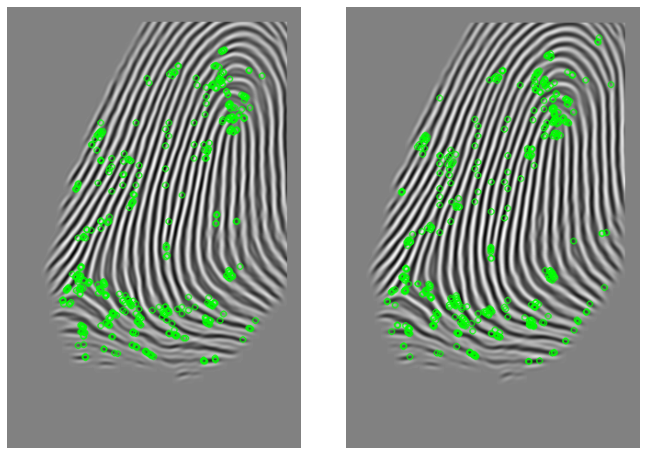

In [158]:
detector1 = cv2.ORB_create()
kp1_orb = detect_keypoints(images_enhanced_db[testNr1], masks_db[testNr1], detector1)
kp2_orb = detect_keypoints(images_enhanced_db[testNr2], masks_db[testNr2], detector1)
print("Number of keypoints with ORB:",len(kp1_orb),"kp1 points and",len(kp2_orb),"kp2 points.") #list of n keypoints for each example

img1_orb = cv2.drawKeypoints(images_enhanced_db[testNr1],kp1_orb,None,color=(0,255,0), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)
img2_orb = cv2.drawKeypoints(images_enhanced_db[testNr2],kp2_orb,None,color=(0,255,0), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)

f, axarr = plt.subplots(1,2,sharey=True)
f.tight_layout()

f.set_size_inches(10,8) #Uncomment below line to change figure size
axarr[0].axis('off')
axarr[1].axis('off')
axarr[0].imshow(img1_orb),axarr[1].imshow(img2_orb),plt.show();

#### 2) SIFT: Scale-Invariant Feature Transform

Number of keypoints with SIFT: 19 kp1 points and 16 kp2 points.


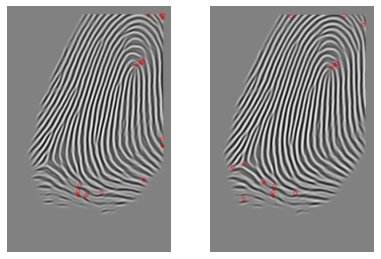

In [159]:
from cv2 import xfeatures2d

detector2 = xfeatures2d.SIFT_create()
kp1_sift = detect_keypoints(images_enhanced_db[testNr1], masks_db[testNr1], detector2)
kp2_sift = detect_keypoints(images_enhanced_db[testNr2], masks_db[testNr2], detector2)
print("Number of keypoints with SIFT:",len(kp1_sift),"kp1 points and",len(kp2_sift),"kp2 points.")

img1_sift = cv2.drawKeypoints(images_enhanced_db[testNr1],kp1_sift,None,color=(255,0,0), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)
img2_sift = cv2.drawKeypoints(images_enhanced_db[testNr2],kp2_sift,None,color=(255,0,0), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)

f, axarr = plt.subplots(1,2,sharey=True)
f.tight_layout()

#f.set_size_inches(10,8) #Uncomment below line to change figure size
axarr[0].axis('off')
axarr[1].axis('off')
axarr[0].imshow(img1_sift),axarr[1].imshow(img2_sift),plt.show();

#### 3) SURF: Speeded-Up Robust Features

Number of keypoints with SIFT: 457 kp1 points and 456 kp2 points.


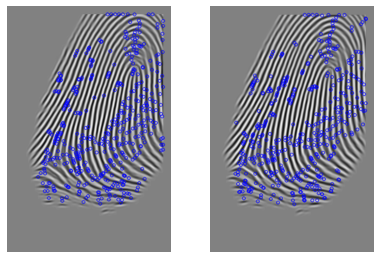

In [160]:
detector3 = xfeatures2d.SURF_create(400) #Hessian threshold set to 400
kp1_surf = detect_keypoints(images_enhanced_db[testNr1], masks_db[testNr1], detector3)
kp2_surf = detect_keypoints(images_enhanced_db[testNr2], masks_db[testNr2], detector3)

print("Number of keypoints with SIFT:",len(kp1_surf),"kp1 points and",len(kp2_surf),"kp2 points.")
img1_surf = cv2.drawKeypoints(images_enhanced_db[testNr1],kp1_surf,None,color=(0,0,255), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)
img2_surf = cv2.drawKeypoints(images_enhanced_db[testNr2],kp2_surf,None,color=(0,0,255), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)

f, axarr = plt.subplots(1,2,sharey=True)
f.tight_layout()

#f.set_size_inches(10,8) #Uncomment below line to change figure size
axarr[0].axis('off')
axarr[1].axis('off')
axarr[0].imshow(img1_surf),axarr[1].imshow(img2_surf),plt.show();


In [161]:
print("Feature extractor: (kp for example, vectors of local feature descriptors for each kp)")
print("ORB:",local_des1_orb.shape,local_des2_orb.shape)
kp1_sift, local_des1_sift = compute_local_descriptor(images_enhanced_db[testNr1], kp1_sift, detector2)
kp2_sift, local_des2_sift = compute_local_descriptor(images_enhanced_db[testNr2], kp2_sift, detector2)
print("SIFT:",local_des1_sift.shape,local_des2_sift.shape)
kp1_surf, local_des1_surf = compute_local_descriptor(images_enhanced_db[testNr1], kp1_surf, detector3)
kp2_surf, local_des2_surf = compute_local_descriptor(images_enhanced_db[testNr2], kp2_surf, detector3)
print("SURF:",local_des1_surf.shape,local_des2_surf.shape)

# SIFT: Visualize the matched keypoints
# store the local keypoint matches
local_k1_k2_matches_sift = brute_force_matcher(local_des1_sift, local_des2_sift, cv2.NORM_L2)

# save the source index and target index of the keypoints in the corresponding keypoint sets
local_pt_source2, local_pt_target2 = np.array([
    (match.queryIdx, match.trainIdx) for match in local_k1_k2_matches_sift]).T

imMatches_sift = cv2.drawMatches(images_enhanced_db[testNr1],kp1_sift,
                            images_enhanced_db[testNr2],kp2_sift,local_k1_k2_matches_sift, None) 

# SURF
# store the local keypoint matches
local_k1_k2_matches_surf = brute_force_matcher(local_des1_surf, local_des2_surf, cv2.NORM_L2)

# save the source index and target index of the keypoints in the corresponding keypoint sets
local_pt_source3, local_pt_target3 = np.array([
    (match.queryIdx, match.trainIdx) for match in local_k1_k2_matches_surf]).T

imMatches_surf = cv2.drawMatches(images_enhanced_db[testNr1],kp1_surf,
                            images_enhanced_db[testNr2],kp2_surf,local_k1_k2_matches_surf, None) 

Feature extractor: (kp for example, vectors of local feature descriptors for each kp)
ORB: (431, 32) (445, 32)
SIFT: (19, 128) (16, 128)
SURF: (457, 64) (456, 64)


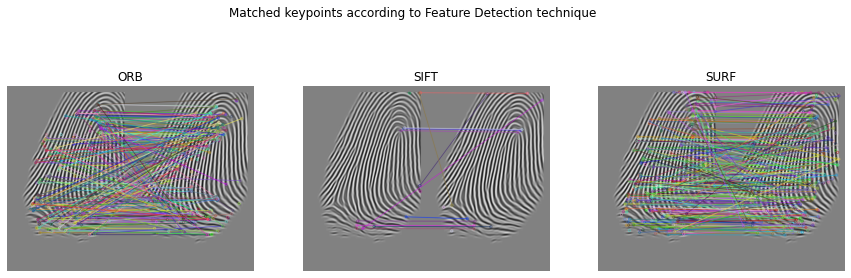

In [162]:
fig = plt.figure(figsize=(15, 5))

fig.add_subplot(1, 3, 1)
plt.imshow(imMatches_orb) 
plt.axis('off');
plt.title("ORB");
fig.add_subplot(1, 3, 2)
plt.imshow(imMatches_sift) 
plt.axis('off');
plt.title("SIFT");
fig.add_subplot(1, 3, 3)
plt.imshow(imMatches_surf) 
plt.axis('off');
plt.title("SURF");
fig.suptitle('Matched keypoints according to Feature Detection technique');
plt.savefig('local_keypoint_matching.png')

# QUESTION J: Create a biometric identification or authentication system on a modality of choice and evaluate it (6pt). ECG biometric system

# QUESTION H: Feature extraction using a different technique (I): PREWITT FILTERS


In [229]:
from skimage.filters import prewitt_h,prewitt_v

def mse_error(imageA, imageB):
    err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
    err /= float(imageA.shape[0] * imageA.shape[1])    
    return err

hp = prewitt_h(perp_img_en)
vp = prewitt_v(perp_img_en) #(480, 320)
 
mse_scores = []
for img in images_enhanced_db:
    h = prewitt_h(img)
    v = prewitt_v(img)
    mse_h = mse_error(hp,h)
    mse_v = mse_error(vp,v)
    #mse = np.mean([mse_h,mse_v])
    mse = mse_h * mse_v
    mse_scores.append(mse)

index = mse_scores.index(np.min(mse_scores))
print("The most probable suspect for this feature extractor is ",labels_db[index])


The most probable suspect for this feature extractor is  023


# QUESTION H: Another attemp. Feature extraction using a completely different technique (II): PCA

In [240]:
fingerprints = [perp_img_en] #first one is the perpetrator
for img in images_enhanced_db:
    fingerprints.append(img)
    
fingerprints = np.array(fingerprints) #concatenate all images in one array
print(fingerprints.shape) #nb_images x (dim1xdim2)

(101, 480, 320)


In [241]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA

class IdentityFeatureExtractor:
    """A simple function that returns the input"""
    
    def transf(self, X):
        return X
    
    def __call__(self, X):
        return self.transf(X)
    
fExtractor = IdentityFeatureExtractor()

#From CV course
class PCAFeatureExtractor(IdentityFeatureExtractor):
    """TODO: this feature extractor is under construction"""
    
    def __init__(self, n_components, size):
        self.n_components = n_components
        self.size = size
        
           
    def create_matrix(self,train_X): #create matrix of all images flattened as a row vector
        matrix = train_X
        full_matrix = []

        for i in range(matrix.shape[0]):
            img = np.uint8(matrix[i,:,:])
            img = img.flatten()
            full_matrix.append(img)
    
        full_matrix = np.array(full_matrix) 
        self.matrix=full_matrix
        return self.matrix
      
    def extract_centered_matrix(self, matrix): 
        avg_vector = matrix.mean(0)
        centered_matrix = matrix - avg_vector
        
        return centered_matrix

    def transf(self,train_X):
        matrix = self.create_matrix(train_X)
        centered_matrix = self.extract_centered_matrix(matrix)
        
        scaler = StandardScaler()
        x_train = scaler.fit_transform(centered_matrix)
        
        # Fit the model
        pca = PCA(n_components = self.n_components, svd_solver="randomized",whiten=True).fit(x_train)
        self.pca=pca
        self.singular_values = pca.singular_values_
        
    # Projecting the input data on the eigenfaces orthonormal basis
        x_train_pca = pca.transform(x_train)
        
        # Extract the eigenfaces
        self.eigenfaces = pca.components_
        
        # Extract the variance ratio 
        self.variances = pca.explained_variance_ratio_
        
        return x_train_pca
                        

In [249]:
obj = PCAFeatureExtractor(30,(480,320)) #for example, with 30 components

fp_pca = obj(fingerprints);
print(fp_pca.shape) #nb of images x nb of components(features that describe each image)
eucl = lambda x,y: distance.euclidean(x,y) #euclidean distance as similarity metric
sim_pca = constructSimilarityTable(fp_pca[0],fp_pca[1:], labels_db, eucl) #euclidean
sim_pca2 = constructSimilarityTable(fp_pca[0],fp_pca[1:], labels_db, mss) #mss (first part of assignment)

#print(sim_pca)  
#print(sim_pca2)

(101, 30)


Eucl IDs - MSS IDs
024 	 096
053 	 028
004 	 077
006 	 062
069 	 084
067 	 072
026 	 085
078 	 008
099 	 014
068 	 041


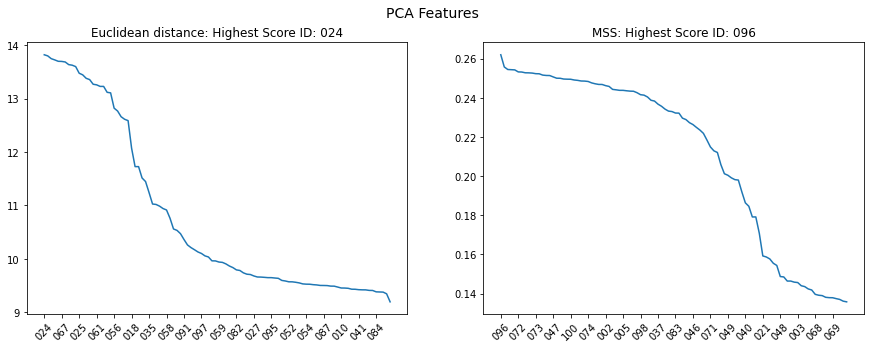

In [256]:
# same as before in other cases, plot scores

fig = plt.figure(figsize=(15, 5))

fig.add_subplot(1, 2, 1)
ids_pca,scores_pca = sim_pca.sort_values(by='score', ascending=False).values[:,0],sim_pca.sort_values(by='score', ascending=False).values[:,1]
plt.plot(ids_pca,scores_pca);
plt.xticks(np.arange(0,100,5),ids_pca[np.arange(0,100,5)],rotation = 45);
plt.title('Euclidean distance: Highest Score ID: '+ids_pca[0]);

# with mss metric
fig.add_subplot(1, 2, 2)
ids_pca2,scores_pca2 = sim_pca2.sort_values(by='score', ascending=False).values[:,0],sim_pca2.sort_values(by='score', ascending=False).values[:,1]
plt.plot(ids_pca2,scores_pca2);
plt.xticks(np.arange(0,100,5),ids_pca2[np.arange(0,100,5)],rotation = 45);
plt.title('MSS: Highest Score ID: '+ids_pca2[0]);

print("Eucl IDs - MSS IDs") #we can see they are obviosuly different
[print(ids_pca[i], "\t",ids_pca2[i]) for i in range(10)];

fig.suptitle("PCA Features", fontsize=14);


# QUESTION K:  Deep learning approach
## 6 perpetrator images (class 0) and 94 remaining images (class 1)

THIS IS THE LAST PART OF THE NOTEBOOK. 
In this part of code, which is presented at the end of the notebook as a draft, I am aware that some augmented images that are obtained from some test images are used to train , which is a mistake as already said in the report in the explanation of this part. Nevertheless, I wanted to show that the results are not as we could expect if we do not have a good and broad dataset and if the pipeline we follow is not okay, because the system is quite poor in the predictions. Specially, perhaps given the poor variability of the class 0 examples, there is a large imbalance towards predicting frequently as class 1 (only 22 examples out of 730 total test examples are predicted as class 0, and of those 22 half are false positives, we can see it below in the confusion matrix). This is evidence that this is an error and the system is not working well in this case.

In [211]:
from keras.preprocessing.image import ImageDataGenerator
from skimage import io
import numpy as np
import os
from PIL import Image

datagen2 = ImageDataGenerator(        
        rotation_range = 90,
        shear_range = 0.2,
        horizontal_flip = True,
        brightness_range = (0.5, 1.5))

image_directory = "data/NIST301/"
aug_image_directory = "data/NIST301_aug2"
SIZE = (480,320,3)
#IDS that we will consider perpetrator (the 6 we know they are the same)
ids_perpetrator = ['056','049','018','048','076','022'] 

In [105]:
# THIS IS THE GENERATOR OF THE IMAGES: in the data folder, where a folder with that name should be in
my_images2 = os.listdir(image_directory)
for image_name in my_images2:    
    if (image_name.split('.')[1] == 'png'):        
        image = io.imread(image_directory + image_name)   

        if (len(image.shape)!=3):
            image = np.stack([image,image,image],axis=2)
            
        name = image_name.split('.')[0]
        image = image.reshape((1, ) + image.shape)  
        if name in ids_perpetrator:
            j = 0
            for batch in datagen2.flow(image, batch_size=1,
                          save_to_dir= aug_image_directory, #save images in this folder
                          save_prefix='aug_{}'.format(name), #save as aug_ID_0_RANDOMNUMBER
                          save_format='png'):    
                j += 1    
                if j > 299: #number of augmented images to create from each original image (6X300=1800 CLASS0) 
                    break
        else:
            j = 0
            for batch in datagen.flow(image, batch_size=1,
                          save_to_dir= aug_image_directory, #save images in this folder
                          save_prefix='aug_{}'.format(name), #save as aug_ID_0_RANDOMNUMBER
                          save_format='png'):    
                j += 1    
                if j > 19: #number of augmented images to create from each original image (94X20=1880 CLASS1)     
                    break

In [213]:
augmented = os.listdir(aug_image_directory) #all the augmented images (ONLY FOR TRAINING)

print("Number of augmented images in dataset (train and validation):",len(augmented))
labels = []
for img in augmented:    
    if (img.split('.')[1] == 'png'):
        labelT = img.split('_0_')[0]
        label = labelT.split('aug_')[1]
        if label in ids_perpetrator:
            labels.append(0) #perpetrator: class 0
        else:
            labels.append(1) #non-perpetrator: class 1
        

labels = np.array(labels)
print("Number of labels from augmented images (train and validation):",len(labels))
#print(labels[3]) #example
v,c = np.unique(labels, return_counts=True)
print("Perpetrator examples (class 0) of dataset (train and validation):",c[0])
print("Non-perpetrator examples (class 1) of dataset (train and validation):",c[1])

# Same transformation for labels for test set (original, not augmented)
original = os.listdir(image_directory)
labels_test = []
for img in original:    
    if (img.split('.')[1] == 'png'):
        label = img.split('.')[0]
        if label in ids_perpetrator:
            labels_test.append(0) #perpetrator: class 0
        else:
            labels_test.append(1) #non-perpetrator: class 1
            
print("\nNumber of original images in dataset (test):",len(original))
labels_test = np.array(labels_test)
print("Number of labels from augmented images (test):",len(labels_test))

Number of augmented images in dataset (train and validation): 3648
Number of labels from augmented images (train and validation): 3648
Perpetrator examples (class 0) of dataset (train and validation): 1772
Non-perpetrator examples (class 1) of dataset (train and validation): 1876

Number of original images in dataset (test): 100
Number of labels from augmented images (test): 100


In [215]:
from sklearn.model_selection import train_test_split
#labels = [int(x) for x in labels] #from string to int
X_train, X_test, y_train, y_test = train_test_split(augmented, labels, test_size=0.2)
print("Train length:",len(X_train),"examples and", len(y_train),"labels.")
print("Test length:",len(X_test),"examples and",len(y_test),"labels.")
y_train = np.array(y_train)
y_test = np.array(y_test)
vtr,ctr = np.unique(y_train, return_counts=True)
vt,ct = np.unique(y_test, return_counts=True)
print("Train:",vtr,ctr)
print("Test:",vt,ct)

Train length: 2918 examples and 2918 labels.
Test length: 730 examples and 730 labels.
Train: [0 1] [1412 1506]
Test: [0 1] [360 370]


In [216]:
import time

def save_imgs(list_images):
    arrays_img = []
    all_images = os.listdir("data/NIST301_aug2")
    for i in range(len(list_images)):
        for img in all_images:
            if (list_images[i]==img):    
                img_array = io.imread(os.path.join("data/NIST301_aug2/",img))            
                arrays_img.append(img_array)
        
    arrays_img = np.array(arrays_img)
    arrays_img = np.float16(arrays_img)
    return arrays_img

start = time.time()

try:
    with open("images_train_test_bin.pkl","rb") as r:
        X_train_img, X_test_img = pickle.load(r)
except:
    X_train_img = save_imgs(X_train)
    X_test_img = save_imgs(X_test)
    with open("images_train_test_bin.pkl",'wb') as r:
        pickle.dump([X_train_img,X_test_img],r)
        
print("Time elapsed:",round(time.time() - start,2),"seconds.")
print("Training images:",X_train_img.shape)
print("Training labels:",y_train.shape)
print("Test images:",X_test_img.shape)
print("Test labels:",y_test.shape)


Time elapsed: 15.73 seconds.
Training images: (2918, 480, 320, 3)
Training labels: (2918,)
Test images: (730, 480, 320, 3)
Test labels: (730,)


In [217]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import datasets, layers, models

# Basic CNN
model = models.Sequential ([
        tf.keras.layers.Conv2D(filters=24, kernel_size=(3, 3), activation='relu', input_shape=(480, 320, 3)), 
         tf.keras.layers.MaxPool2D(pool_size=(2, 2)),
    tf.keras.layers.Dropout(.2),
        tf.keras.layers.Conv2D(36, (3, 3), activation='relu'),
         tf.keras.layers.MaxPool2D(pool_size=(2, 2)),
        tf.keras.layers.Conv2D(48, (3, 3), activation='relu'),
         tf.keras.layers.MaxPool2D(pool_size=(2, 2)),
    tf.keras.layers.Dropout(.2)

])
model.add(layers.Flatten())
model.add(layers.Dense(900, activation='relu'))
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(2, activation='softmax')) #capa de salida con 100 clases

# Learning process configuration
model.compile(optimizer='adam', 
              loss='sparse_categorical_crossentropy', #sparse_categorical_crossentropy
              metrics=['accuracy']) 

In [218]:
# Training the model
hist = model.fit(X_train_img, y_train, validation_split = 0.2, epochs = 8, batch_size=32) 

Train on 2334 samples, validate on 584 samples
Epoch 1/8
2334/2334 [==============================] - 704s 302ms/sample - loss: 471.6732 - accuracy: 0.5193 - val_loss: 0.7368 - val_accuracy: 0.4675
Epoch 2/8
2334/2334 [==============================] - 710s 304ms/sample - loss: 0.6936 - accuracy: 0.5296 - val_loss: 0.6966 - val_accuracy: 0.4709
Epoch 3/8
2334/2334 [==============================] - 1697s 727ms/sample - loss: 0.6923 - accuracy: 0.5283 - val_loss: 0.6996 - val_accuracy: 0.4726
Epoch 4/8
2334/2334 [==============================] - 921s 395ms/sample - loss: 0.6907 - accuracy: 0.5360 - val_loss: 0.6991 - val_accuracy: 0.4743
Epoch 5/8
2334/2334 [==============================] - 692s 296ms/sample - loss: 0.6879 - accuracy: 0.5364 - val_loss: 0.6994 - val_accuracy: 0.4829
Epoch 6/8
2334/2334 [==============================] - 676s 290ms/sample - loss: 0.6884 - accuracy: 0.5411 - val_loss: 0.6971 - val_accuracy: 0.4760
Epoch 7/8
2334/2334 [==============================] - 6

In [219]:
# Save the model and test predictions
#model.save('data/model_binary.h5')
new_model = tf.keras.models.load_model('data/model_binary.h5') # load, it is saved in the data folder
start = time.time()
predicted_label = model.predict_classes(X_test_img)
print("Time elapsed in prediction:",round(time.time() - start,2),"seconds.")

Time elapsed in prediction: 69.45 seconds.


Accuracy in test set:  0.5068493150684932


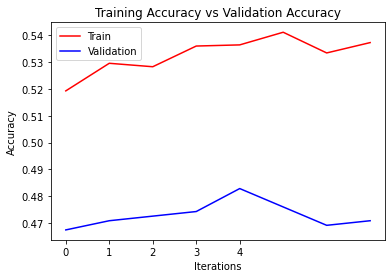

In [220]:
from sklearn.metrics import accuracy_score
# Mostrar matriz de confusion y precision sobre los ejemplos de test
accuracy = accuracy_score(y_test, predicted_label)
print("Accuracy in test set: ", accuracy)

# Resultados
plt.plot(hist.history['accuracy'],'r') 
plt.plot(hist.history['val_accuracy'],'b') 
plt.xticks(np.arange(0, 5, 1.0)) 
plt.figsize=(12,6)
plt.xlabel("Iterations"); plt.ylabel("Accuracy")
plt.title("Training Accuracy vs Validation Accuracy") 
plt.legend(['Train','Validation'])
plt.savefig("training_process.png")


In [221]:
from sklearn.metrics import classification_report
report = classification_report(y_test, predicted_label)
print(report)

              precision    recall  f1-score   support

           0       0.50      0.03      0.06       360
           1       0.51      0.97      0.67       370

    accuracy                           0.51       730
   macro avg       0.50      0.50      0.36       730
weighted avg       0.50      0.51      0.37       730



Errors:  360


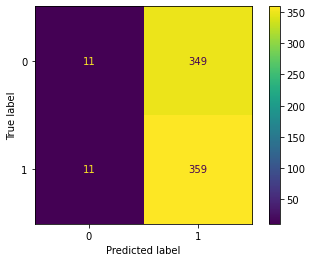

In [222]:
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, ConfusionMatrixDisplay
matrix_conf = confusion_matrix(y_test, predicted_label) 
ConfusionMatrixDisplay(matrix_conf,display_labels=[0, 1]).plot()
print ('Errors: ', y_test.size - np.trace(matrix_conf))